In [ ]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
sys.path.append(module_path)

In [2]:
import numpy as np

In [3]:

import matplotlib.pyplot as plt
import matplotlib as mpl

# inspired by http://nipunbatra.github.io/2014/08/latexify/
params = {
    'text.latex.preamble': ['\\usepackage{gensymb}'],
    'image.origin': 'lower',
    'image.interpolation': 'nearest',
    'image.cmap': 'magma',
    'axes.grid': False,
#     'savefig.dpi': 150,  # to adjust notebook inline plot size
    'axes.labelsize': 8, # fontsize for x and y labels (was 10)
    'axes.titlesize': 8,
    'font.size': 8, # was 10
    'legend.fontsize': 6, # was 10
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'text.usetex': True,
    'figure.figsize': [3.39, 2.10],
    'font.family': 'serif',
    'figure.max_open_warning':10001
}
mpl.rcParams.update(params)

## For colorbar 
from mpl_toolkits.axes_grid1 import make_axes_locatable
#         ## Add colorbar
#         divider = make_axes_locatable(axs[ax_idx])
#         cax1 = divider.append_axes("right", size="5%", pad=0.05)
#         fig.colorbar(img1, cax=cax1)


In [355]:
from misloc_mispol_package.calc import BEM_simulation_wrapper as bem
from misloc_mispol_package.calc import fitting_misLocalization as fit
from misloc_mispol_package.calc import coupled_dipoles as cp
from misloc_mispol_package.calc import coupled_dipoles_copy as cpc
from misloc_mispol_package.optics import anal_foc_diff_fields as afi

from misloc_mispol_package.optics import diffraction_int as diffi

import scipy.optimize as opt
m_per_nm = fit.m_per_nm

In [5]:
import scipy.io as sio

In [6]:
mat_images = sio.loadmat(
    "/Users/chair/Documents/Academia/SuperRes/Biteen_colab/"+
    "from_Biteen_group/rerecoverthelocalization/mov_006_molecule_img_good.mat"
    )

In [7]:
exp_obs_pts = diffi.observation_points(0, 48*20*m_per_nm, 0, 48*20*m_per_nm, 21) ## cm_per_m

In [716]:
hres_obs_pts = diffi.observation_points(0, 48*20*m_per_nm, 0, 48*20*m_per_nm, 201)

### Try Gaussian fitting

In [9]:
gauss_fit_inst = RealFittingTools(exp_obs_pts)
best_fit_params, best_fit = gauss_fit_inst.fit_model(
    np.asarray([mat_images['bgsub_img'][...,26].ravel()]))

In [10]:
hess = best_fit_params.jac.T @ best_fit_params.jac
cov = 2*np.linalg.inv(hess)

image26 = np.asarray([mat_images['bgsub_img'][...,26].ravel()])
data_var = np.std(image26/np.max(image26))**2
res_var = np.std(best_fit_params.fun)**2

unc = cov*res_var
with np.printoptions(precision=3, suppress=True):
    print(unc)

[[  0.002  -0.     -0.     -0.246  -0.263  -0.     -0.   ]
 [ -0.     99.974  -1.557  -0.002  -0.003   0.      0.   ]
 [ -0.     -1.557 113.184  -0.059  -0.05    0.      0.   ]
 [ -0.246  -0.002  -0.059 125.15   26.77   -0.003  -0.064]
 [ -0.263  -0.003  -0.05   26.77  141.689  -0.002  -0.067]
 [ -0.      0.      0.     -0.003  -0.002   0.631   0.   ]
 [ -0.      0.      0.     -0.064  -0.067   0.      0.   ]]


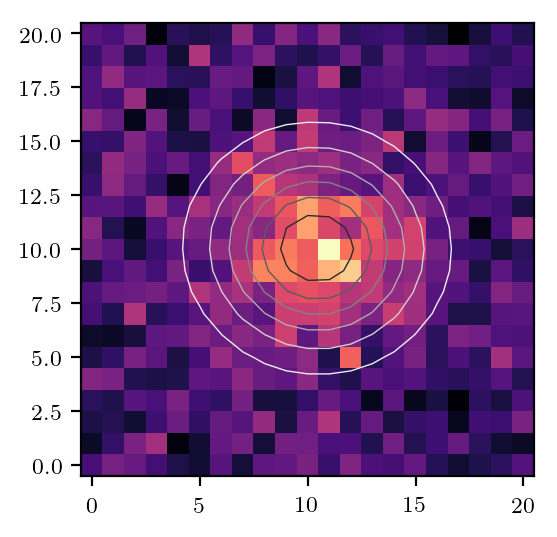

In [11]:
image = mat_images['bgsub_img'][...,26].ravel()

plt.figure(
    figsize=(3,3), 
    dpi=200
) 
ax = plt.axes()

ax.imshow(image.reshape(21,21))

ax.contour(
    range(0,21),
    range(0,21),
    best_fit.reshape(exp_obs_pts[-2].shape),
    cmap='Greys',
    linewidths=0.5,
    )

### Model fitting

In [12]:

def dipole_fields(p, ang, x, y):
    
    p_x = p*np.cos(ang)
    p_y = p*np.sin(ang)

    
    field = real_dipole_fields(np.array([[p_x, p_y, 0]]), np.array([[x, y,0]]))
    
    return field
    

In [13]:
def model_dip_image(p, ang, x, y, offset):
    
    ## Shift coordines to match data
    x = (x)*m_per_nm
    y = (y)*m_per_nm
    
    ## Initialize observation pts
    inst = fit.CoupledDipoles(
        obs_points=exp_obs_pts, 
        drive_energy_eV=2.32
                             )
    
    real_dipole_fields = inst.mb_p_fields
    
    p_x = p*np.cos(ang)
    p_y = p*np.sin(ang)
    
    field = real_dipole_fields(np.array([[p_x, p_y, 0]]), np.array([[x, y, 0]]))
    
    image = inst.image_from_E(field)
    
    return image.ravel() + offset#, field


def normed_model_dip_image(ang, x, y, offset=0):
    
    image = model_dip_image(1, ang, x, y, offset)
    
    normed_image = image / np.max(image)
    
    return normed_image
    

In [14]:
class ReallyRealFittingTools(fit.FittingTools):
    """ Slightly modified FittingTools class for convenience in fitting real data
        I was motivated to write this beacuse I can the covarience for plotting fits"""
    def __init__(self, obs_pts):
        fit.FittingTools.__init__(self, obs_pts)
        
    def fit_model(self, images):
        """ calculate index of maximum in each image. """
        num_of_images = images.shape[0]

        apparent_centroids_xy = np.zeros((num_of_images,2))

        max_positions = self.calculate_max_xy(images)

        for i in np.arange(num_of_images):
            x0 = max_positions[0][i]
            y0 = max_positions[1][i]
            params0 = (2, x0+200, y0+200)
            print(f"params0: {params0}")
            fit_results = opt.least_squares(
                lambda fit_params: (
                    normed_model_dip_image(*fit_params)
                    -
                    (images[i]/np.max(images[i]))
                    ), 
                params0,
                x_scale=[1, 1E2, 1E2],
#                 xtol=0
                )
            resulting_fit_params = fit_results['x']
            fit_gaussian = normed_model_dip_image(
                *resulting_fit_params
                )

        return fit_results, fit_gaussian   ## returns [x_cen(s), y_cen(s)]


In [15]:
exp_fit_inst = ReallyRealFittingTools(exp_obs_pts)
best_fit_params, best_fit = exp_fit_inst.fit_model(
    np.asarray([mat_images['bgsub_img'][...,26].ravel()]))

params0: (2, 680.0, 728.0)


In [16]:
best_fit_params.x

array([  4.83617559, 476.45010805, 508.77954692])

In [17]:
hess = best_fit_params.jac.T @ best_fit_params.jac
cov = 2*np.linalg.inv(hess)

image26 = np.asarray([mat_images['bgsub_img'][...,26].ravel()])
data_var = np.std(image26/np.max(image26))**2
res_var = np.std(best_fit_params.fun)**2

unc = cov*res_var
with np.printoptions(precision=3, suppress=True):
    print(f"Scaled Covariance matrix: \n\n{unc}")

Scaled Covariance matrix: 

[[ 0.017  0.001  0.007]
 [ 0.001 37.187 -7.372]
 [ 0.007 -7.372 84.353]]


Seems more reasonable... Still not sure if that is exactly right. 

#### within a few nm of the Gaussian fit results
4.82265769e+02,  5.00226690e+02,

In [18]:
best_fit_params.message

'`ftol` termination condition is satisfied.'

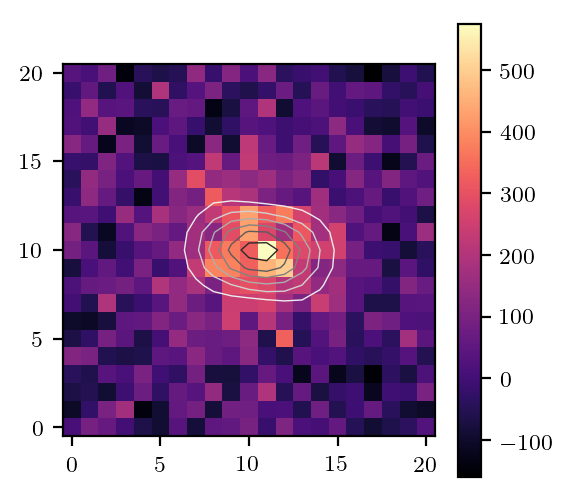

In [19]:
image = mat_images['bgsub_img'][...,26].ravel()

plt.figure(
    figsize=(3,3), 
    dpi=200
) 
ax = plt.axes()

img = ax.imshow(image.reshape(21,21))

ax.contour(
    range(0,21),
    range(0,21),
    best_fit.reshape(exp_obs_pts[-2].shape),
    cmap='Greys',
    linewidths=0.5,
    )
plt.colorbar(img)

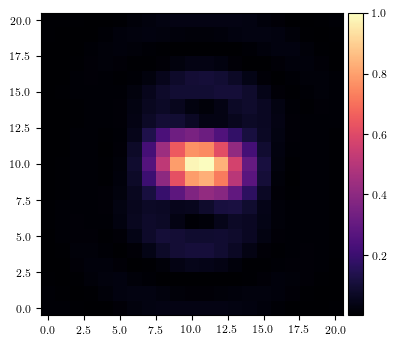

In [50]:
fig = plt.figure(dpi=100)
ax = plt.axes()
img1 =ax.imshow(
#     range(0,21),
#     range(0,21),
    best_fit.reshape(exp_obs_pts[-2].shape),
#     cmap='Greys',
#     linewidths=0.5,
    )
## Add colorbar
divider = make_axes_locatable(plt.gca())
cax1 = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(img1, cax=cax1)

OK, lets try fitting a plasmon coupled image.

### Collecting images that have obvious plasmons in background

In [28]:
img_idxs_w_plas = [
    0,
    3, 
    10, 
    11,
    14,
    21, 
    23, 
    36,
    38,
    127,
    136,
    163,
    164,
    173,
    192,
    199,
    207,
    226,
    246,
    253,
    269,
    294,
    303,
    305,
    318,
    320,
    321,
    329,
    334,
    364,
    369,
    381,
    383,
    438,
    447,
    469,
    530,
    549,
    555,
    566,
    576,
    579,
    584, 
    601,
    646,
    648,
    667,
    691,
    696,
    718,
    728,
    738,
    757,
    764, ## ACTUALLY LOOKS PROMISING!!!
    776, ## ALSO LOOKS PROMISING!??!
    787,
    791, ## Weirdly similar to the last two good ones....
    801,
    811,
    821,
    826,
    831, ## Very suspicious...
    846,
    849,
    862,
    864,
    879,
    895,
    899,
    917,
    936,
    939,
    942,
    967,
    972,
    987,
    999,
    1001,
    1012,
    1041,
    1053,
    1066,
    1068,
    1091,
    1125,
    1141,
    1154,
    1169,
    1174,
    1182,
    1191,
    1206,
    1213,
    1229,
    1235,
    1250,
    1269,
    1281,
    1300,
    1349,
    1368,
    1382,
    1383,
    1398,
    1412,
    1444,
    1445,
    1446,
    1455,
    1460,
    1461,
    1468,
    1485,
    1496,
    1499,
    1508,
    1510,
    1522,
    1536,
    1541,
    1542,
    1559,
    1574,
    1577,
    1595,
    1610,
    1641,
    1652,
    1654,
    1663,
    1678,
    1681,
    1692,
    1696,
    1719,
    1720,
    1723,
    1741,
    1774,
    1790,
    1791,
    1807,
    1825,
    1826,
    1845,
    1866,
    1867,
    1872,
    1886,
    1890,
    1900,
    1903,
    1917,
    1951,
    1971,
    1982,
    1990,
    2008,
    2061,
    2063,
    2079,
    2096,
    2097,
    2098,
    2100,
    2113,
    2127,
    2128,
    2138,
    2152, ## Very nice!
    2165,
    2172,
    2180,
    2188, ## YES
    2190,
    2194,
    2198,
    2207,
    2233,
    2234,
    2248,
    2258,
    2265,
    2290,
    2319,
    2323,
    2337,
    2352,
    2367,
    2412,
    2434,
    2436,
    2437,
    2449,
    2461,
    2466,
    2479,
    2482,
    2491,
    2493,
    2508,
    2511,
    2529,
    2541,
    2544,
    2554, #YES
    2556,
    2565,
    2566,
    2571,
    2589,
    2608,
    2620,
    2624,
    2640,
    2641,
    2642,
    2643,
    2657,
    2673,
    2675,
    2677,
    2691,
    2692,
    2708,
    2709,
    2710,
    2721,
    2726,
    2729,
    2755,
    2759,
    2767,
    2771,
    2829,
    2849,
    2876,
    2877,
    2878,
    2893,
    2894,
    2896,
    2897,
    2915,
    2925,
    2926,
    2940,
    2987,
]

Is there a defined polarization for the plasmon emission?

What images was Curly fitting to build the localization map?

In [96]:
mat_images.keys()

dict_keys(['__header__', '__version__', '__globals__', 'bg_img', 'bgsub_img', 'raw_img'])

In [97]:
mat_images['raw_img'].shape

(21, 21, 3000)

processing figure 0
processing figure 3
processing figure 10
processing figure 11
processing figure 14
processing figure 21
processing figure 23
processing figure 36
processing figure 38
processing figure 127
processing figure 136
processing figure 163
processing figure 164
processing figure 173
processing figure 192
processing figure 199
processing figure 207
processing figure 226
processing figure 246
processing figure 253
processing figure 269
processing figure 294
processing figure 303
processing figure 305
processing figure 318
processing figure 320
processing figure 321
processing figure 329
processing figure 334
processing figure 364
processing figure 369
processing figure 381
processing figure 383
processing figure 438
processing figure 447
processing figure 469
processing figure 530
processing figure 549
processing figure 555
processing figure 566
processing figure 576
processing figure 579
processing figure 584
processing figure 601
processing figure 646
processing figure 648

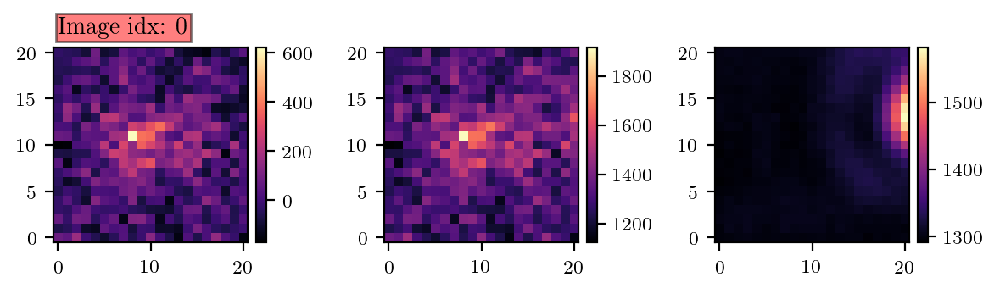

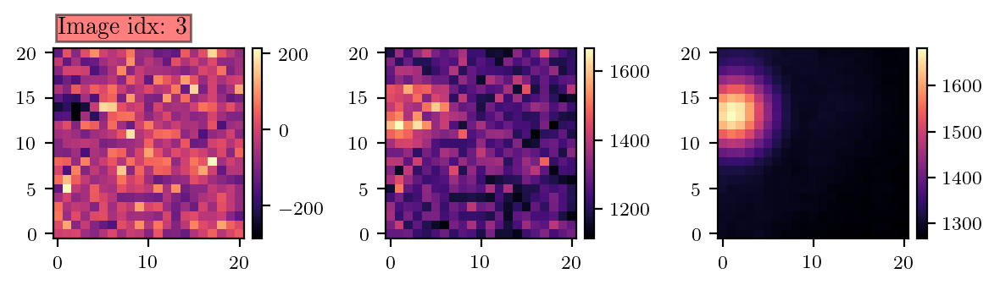

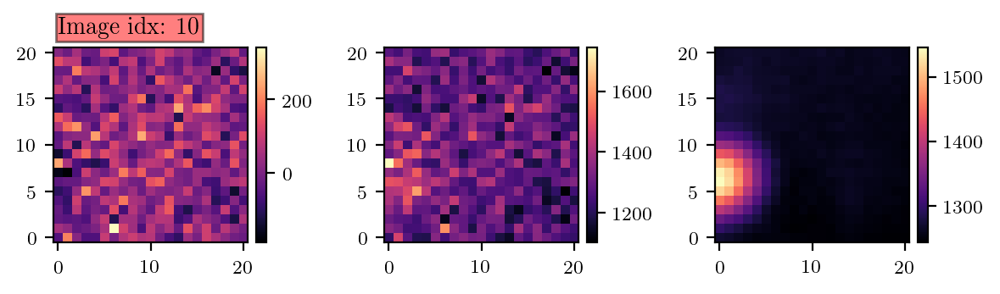

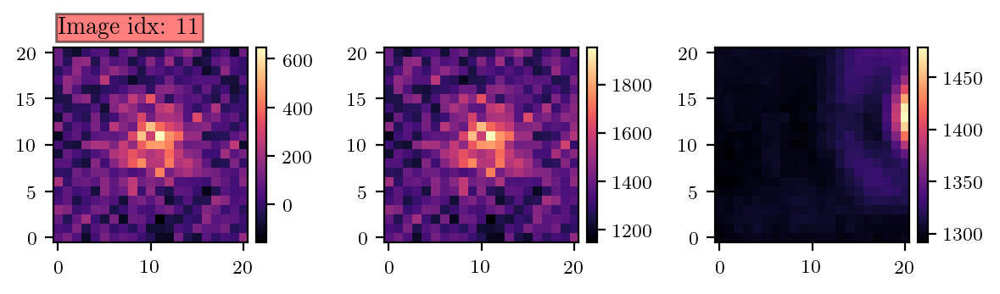

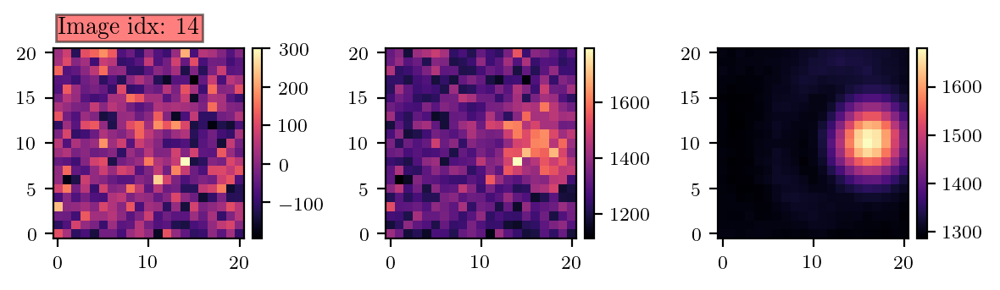

...

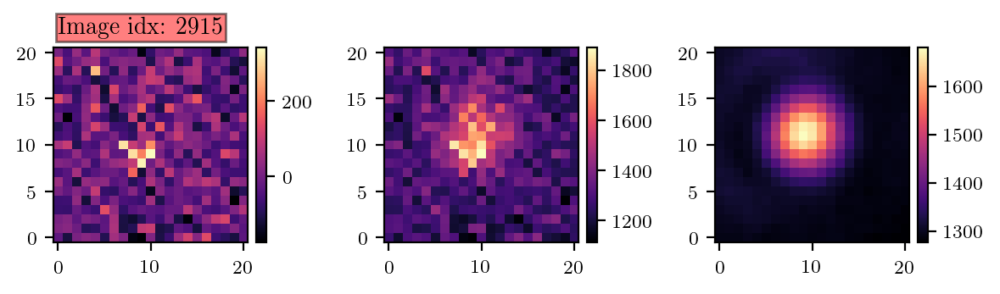

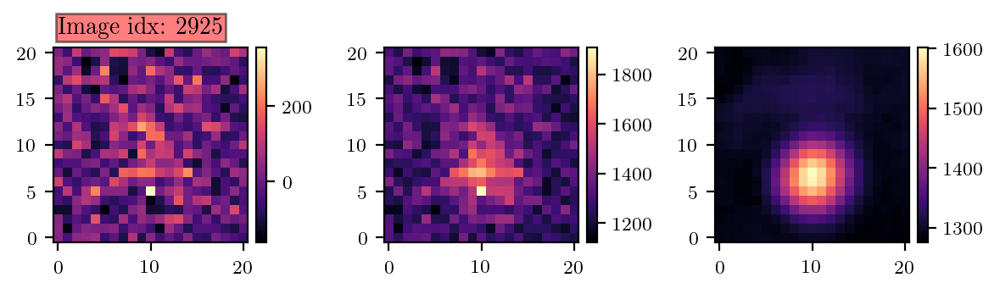

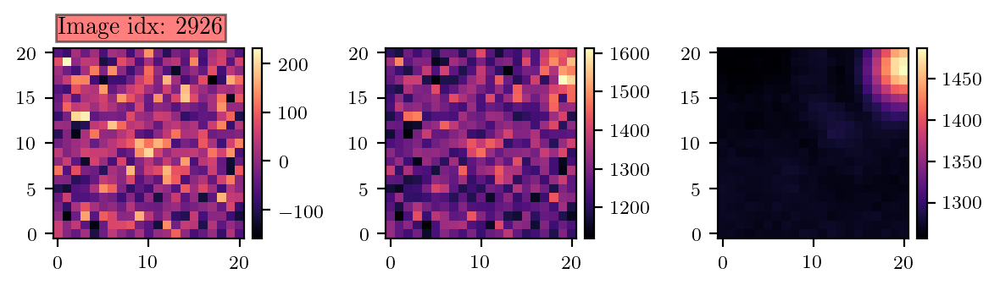

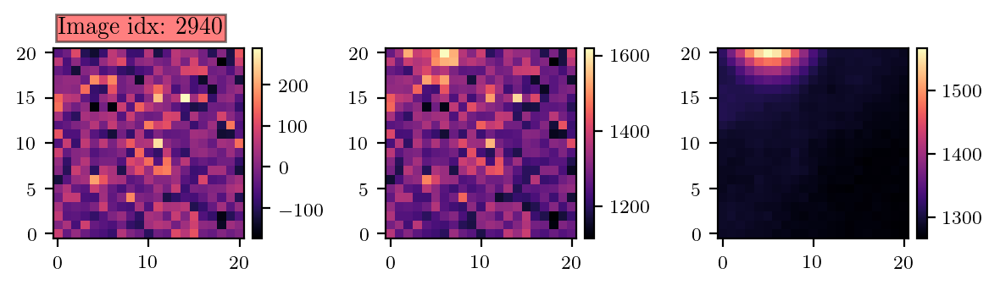

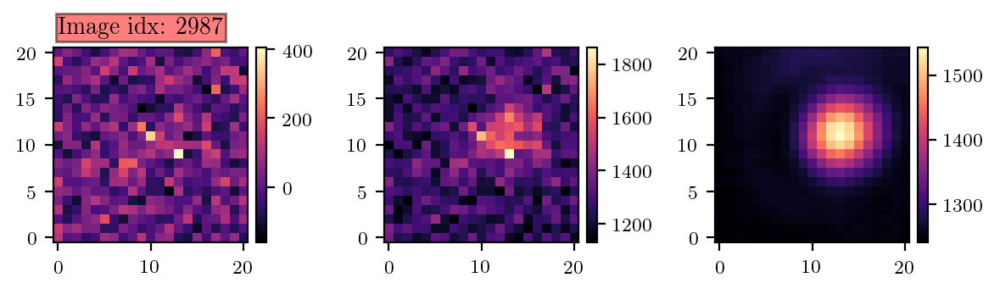

In [32]:

for i in img_idxs_w_plas:

    print(f'processing figure {i}')
    
    fig, axs = plt.subplots(
        ncols=3,
        dpi=200,
        figsize=(6,2)
        
        )
    
    for ax_idx, name in zip(
        [0,1,2], ["bgsub_img", "raw_img", "bg_img"]):

        img1 = axs[ax_idx].imshow(mat_images[name][...,i])
        if ax_idx is 0:
            axs[ax_idx].text(
                0, 22, f'Image idx: {i}', 
                style='italic',
                bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 1}
                   )
        ## Add colorbar
        divider = make_axes_locatable(axs[ax_idx])
        cax1 = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(img1, cax=cax1)
   
    plt.tight_layout(h_pad=1)
    

#### Things to do

- fit gaussians to each backsub_img
- fit gaussians to each background to get plas position

In [20]:
mat_images.keys()

dict_keys(['__header__', '__version__', '__globals__', 'bg_img', 'bgsub_img', 'raw_img'])

numpy.ndarray

In [30]:
gauss_fit_params_w_plas_back = [np.nan]*len(img_idxs_w_plas)

for i, val in enumerate(img_idxs_w_plas):
    best_fit_params, best_fit = gauss_fit_inst.fit_model(
        np.asarray([mat_images['bgsub_img'][...,val].ravel()])
        )
    gauss_fit_params_w_plas_back[i] = best_fit_params
#     if i % 10 is 0: 
    print(i,'/',len(gauss_fit_params_w_plas_back))

0 / 248
1 / 248
2 / 248
3 / 248
4 / 248
5 / 248
6 / 248
7 / 248
8 / 248
9 / 248
10 / 248
11 / 248
12 / 248
13 / 248
14 / 248
15 / 248
16 / 248
17 / 248
18 / 248
19 / 248
20 / 248
21 / 248
22 / 248
23 / 248
24 / 248
25 / 248
26 / 248
27 / 248
28 / 248
29 / 248
30 / 248
31 / 248
32 / 248
33 / 248
34 / 248
35 / 248
36 / 248
37 / 248
38 / 248
39 / 248
40 / 248
41 / 248
42 / 248
43 / 248
44 / 248
45 / 248
46 / 248
47 / 248
48 / 248
49 / 248
50 / 248
51 / 248
52 / 248
53 / 248
54 / 248
55 / 248
56 / 248
57 / 248
58 / 248
59 / 248
60 / 248
61 / 248
62 / 248
63 / 248
64 / 248
65 / 248
66 / 248
67 / 248
68 / 248
69 / 248
70 / 248
71 / 248
72 / 248
73 / 248
74 / 248
75 / 248
76 / 248
77 / 248
78 / 248
79 / 248
80 / 248
81 / 248
82 / 248
83 / 248
84 / 248
85 / 248
86 / 248
87 / 248
88 / 248
89 / 248
90 / 248
91 / 248
92 / 248
93 / 248
94 / 248
95 / 248
96 / 248
97 / 248
98 / 248
99 / 248
100 / 248
101 / 248
102 / 248
103 / 248
104 / 248
105 / 248
106 / 248
107 / 248
108 / 248
109 / 248
110 / 248


In [33]:
gauss_fit_params_w_plas_back = plas_back_fit_params

In [34]:
plas_back_fit_params = [np.nan]*len(img_idxs_w_plas)

for i, val in enumerate(img_idxs_w_plas):
    best_fit_params, best_fit = gauss_fit_inst.fit_model(
        np.asarray([mat_images['bg_img'][...,val].ravel()])
        )
    plas_back_fit_params[i] = best_fit_params
#     if i % 10 is 0: 
    print(i,'/',len(plas_back_fit_params))

0 / 248
1 / 248
2 / 248
3 / 248
4 / 248
5 / 248
6 / 248
7 / 248
8 / 248
9 / 248
10 / 248
11 / 248
12 / 248
13 / 248
14 / 248
15 / 248
16 / 248
17 / 248
18 / 248
19 / 248
20 / 248
21 / 248
22 / 248
23 / 248
24 / 248
25 / 248
26 / 248
27 / 248
28 / 248
29 / 248
30 / 248
31 / 248
32 / 248
33 / 248
34 / 248
35 / 248
36 / 248
37 / 248
38 / 248
39 / 248
40 / 248
41 / 248
42 / 248
43 / 248
44 / 248
45 / 248
46 / 248
47 / 248
48 / 248
49 / 248
50 / 248
51 / 248
52 / 248
53 / 248
54 / 248
55 / 248
56 / 248
57 / 248
58 / 248
59 / 248
60 / 248
61 / 248
62 / 248
63 / 248
64 / 248
65 / 248
66 / 248
67 / 248
68 / 248
69 / 248
70 / 248
71 / 248
72 / 248
73 / 248
74 / 248
75 / 248
76 / 248
77 / 248
78 / 248
79 / 248
80 / 248
81 / 248
82 / 248
83 / 248
84 / 248
85 / 248
86 / 248
87 / 248
88 / 248
89 / 248
90 / 248
91 / 248
92 / 248
93 / 248
94 / 248
95 / 248
96 / 248
97 / 248
98 / 248
99 / 248
100 / 248
101 / 248
102 / 248
103 / 248
104 / 248
105 / 248
106 / 248
107 / 248
108 / 248
109 / 248
110 / 248


## try Model fit

Need to parameterize first...
- fit mol spectra
- fit plas spectra

In [50]:
sys.path.append('/')

In [55]:
sys.path

['/Applications/MATLAB_R2017b.app/extern/engines/python/dist/matlab/engine/maci64',
 '/Users/chair/anaconda/envs/py36/lib/python36.zip',
 '/Users/chair/anaconda/envs/py36/lib/python3.6',
 '/Users/chair/anaconda/envs/py36/lib/python3.6/lib-dynload',
 '',
 '/Users/chair/anaconda/envs/py36/lib/python3.6/site-packages',
 '/Users/chair/anaconda/envs/py36/lib/python3.6/site-packages/asteval-0.9.13-py3.6.egg',
 '/Users/chair/anaconda/envs/py36/lib/python3.6/site-packages/lmfit-0.9.12-py3.6.egg',
 '/Users/chair/anaconda/envs/py36/lib/python3.6/site-packages/IPython/extensions',
 '/Users/chair/.ipython',
 '/Users/chair/Documents/Academia/SuperRes/Biteen_colab/Mispolarization/python/gitted',
 '/Users/chair/anaconda/envs/py36/lib/python3.6/site-packages/matlab',
 '/']

In [82]:
path_to_data = (
    "/Users/chair/Documents/Academia/SuperRes/Biteen_colab/"+
    "from_Biteen_group/rerecoverthelocalization/")

In [85]:
R6G_spectrum = sio.loadmat(os.path.join(path_to_data, "R6G_spectrum.mat"))
R6G_spectrum.keys()

dict_keys(['__header__', '__version__', '__globals__', 'bdpr6g'])

In [89]:
R6G_spectrum = R6G_spectrum["bdpr6g"]
R6G_spectrum.shape

(2, 512)

In [92]:
R6G_spectrum[1,:5]

array([16.20765134, 15.52785008, 17.11521971, 17.8350941 , 15.84218462])

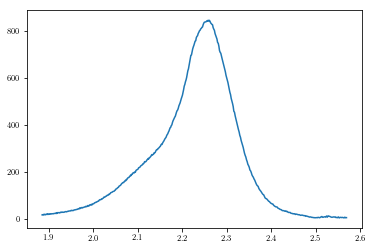

In [275]:
plt.plot(1240/R6G_spectrum[0], R6G_spectrum[1])

Fit 

In [272]:
eps_b

1.778

In [295]:
def mol_spec_model(
    hw, 
#     eps_b,
#     mass, 
    hw_res, 
    hbargamma_nr,  
    ):
    
    gamma = hbargamma_nr/hbar

    alpha = cpc.sparse_polarizability_tensor(
        cpc.fluorophore_mass(70000, gamma), 
        w_res=hw_res/hbar, 
        w=hw/hbar, 
        gamma_nr=gamma, 
        a=0, 
        eps_inf=0, 
        ebs_b=eps_b,
        )
    
    sigma = cpc.sigma_prefactor(hw/hbar, eps_b) * (
        np.abs(alpha[0,0])**2.
        )
    return sigma

In [296]:
hbarws = 1240/R6G_spectrum[0]


In [297]:
#+++++++++++++++++++++++++++++++++++++++++++++

def mol_cost_func(params, *args):
    x=args[0]
    y=args[1]

#     eps_inf=params[0]
    hw_res=params[0]
    hgamma=params[1]
#     a = params[3]
    
    yfit=mol_spec_model(x,*params)
    
    y_normed = y/y.max()
    yfit_normed = yfit/yfit.max()

    return (y_normed-yfit_normed).ravel()

#+++++++++++++++++++++++++++++++++++++++++++++

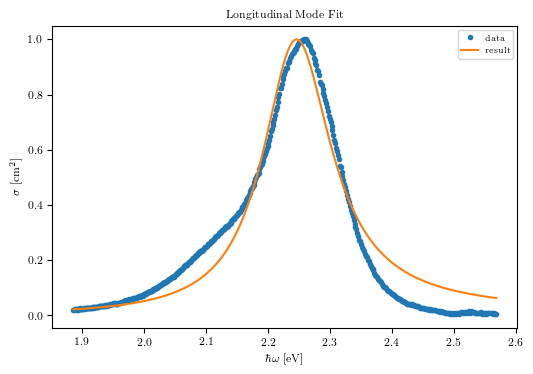

In [298]:
#+++++++++++++++++++++++++++++++++++++++++++++

ini_guess_both=np.array([2.25, .05])
# ini_guess_both=np.array([15.14244193,  8.4634295 , -0.16462349, 64.3292537 , 28.24427368])
params0=ini_guess_both   #parameter guess

args=[hbarws, R6G_spectrum[1],]
# for c in Ts:
#   args.append(c) 
args=tuple(args)   #doesn't work if args is a list!!

result=opt.least_squares(
    mol_cost_func, 
    params0, 
    ftol=1e-15,
    xtol=1e-15, 
    gtol=1e-15, 
    args=args,
#     bounds=(0, np.inf),
#     x_scale=[10,1,1E-2,10],
    )
                         
#+++++++++++++++++++++++++++++++++++++++++++++
fit_result = mol_spec_model(hbarws, *result['x'])
norm_fit_result = fit_result/fit_result.max()

# higher_damp = result['x'].copy()
# higher_damp[2] = 0.22
# higher_damp[3] = 44

# high_damp_result = ret_fit_scat_1(hbarws, *higher_damp)

data = R6G_spectrum[1]
norm_data = data/data.max()

plt.figure(dpi=100)
plt.plot(hbarws, norm_data, label='data', ls=' ', marker='.')
# plt.plot(hbarws, ret_fit_scat_1(hbarws, *ini_guess_both),label='initial', ls='--')
# plt.plot(hbarws, 0.9*high_damp_result/high_damp_result.max(),label='test', ls='-')
plt.plot(hbarws, norm_fit_result,label='result', ls='-')

# plt.xlim([np.min(long_hbarws),np.max(trans_hbarws)])
plt.xlabel(r'$\hbar\omega$ [eV]')
plt.ylabel(r'$\sigma$ [cm$^2$]')
plt.title(r'Longitudinal Mode Fit')
plt.legend()

# plt.figure(dpi=100)
# plt.plot(trans_hbarws, trans_sigma, label='data', ls=' ', marker='.')
# plt.plot(trans_hbarws, ret_fit_scat_2(trans_hbarws, *ini_guess_both), label='initial', ls='--')
# plt.plot(trans_hbarws, ret_fit_scat_2(trans_hbarws, *result['x'])*1e-10, label='result', ls='-')
# plt.xlim([np.min(long_hbarws), np.max(trans_hbarws)])
# plt.xlabel(r'$\hbar\omega$ [eV]')
# plt.ylabel(r'$\sigma$ [cm$^2$]')
# plt.title(r'Transverse Mode Fit')
# plt.legend()

In [299]:
result['x']

array([2.24403839, 0.13499613])

#### Fit plasmon spectra

In [184]:
AuNP_DFSpec = sio.loadmat(os.path.join(path_to_data, "AuNP_DFSpec.mat"))
AuNP_DFSpec.keys()

dict_keys(['__header__', '__version__', '__globals__', 'DF', 'wl'])

In [185]:
((AuNP_DFSpec['DF'][:,0]==AuNP_DFSpec['DF'][:,1] )-1).sum()
## columns are redundant

0

In [186]:
AuNP_DFSpec['wl'].shape

(601, 1)

In [187]:
AuNP_DFSpec['DF'][:, 0, None].shape

(601, 1)

In [188]:
AuNP_DFSpec = np.hstack((AuNP_DFSpec['wl'], AuNP_DFSpec['DF'][:, None,0])).T

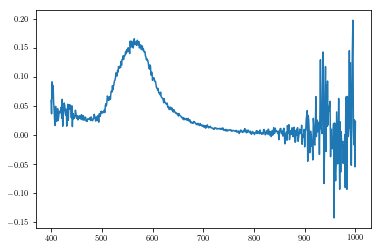

In [189]:
plt.plot(AuNP_DFSpec[0], AuNP_DFSpec[1])

##### Cropping off noisy bs

In [190]:
AuNP_DFSpec=AuNP_DFSpec[:, np.argwhere(np.logical_and(AuNP_DFSpec[0]>475, AuNP_DFSpec[0]<800))]

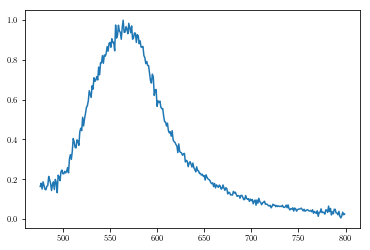

In [191]:
plt.plot(
    AuNP_DFSpec[0], 
    AuNP_DFSpec[1]/np.max(AuNP_DFSpec[1])
    )

Fit

In [192]:
import scipy.constants as con
hbar = con.physical_constants['Planck constant over 2 pi in eV s'][0]
c = con.physical_constants['speed of light in vacuum'][0]*1e2 #cm/m
nm = 1e-7
## DEFINE BACKGROUND FOR FITS
eps_b = 1.778

In [193]:
hbarws = 1240/AuNP_DFSpec[0]

## ----

def ret_fit_scat_1(hbarw, eps_inf, hbarw_p, hbargamma, a):
    return cpc.sigma_scat_ret_sphere(
        hbarw/hbar, eps_inf, hbarw_p/hbar, hbargamma/hbar, eps_b, a*nm)
# def ret_fit_scat_2(hbarw, eps_inf, hbarw_p, hbargamma, a_1, a_2):
#     return cp.short_sigma_scat_ret_pro_ellip(hbarw/hbar, eps_inf, hbarw_p/hbar, hbargamma/hbar, eps_b, a_1*nm, a_2*nm)*1e10

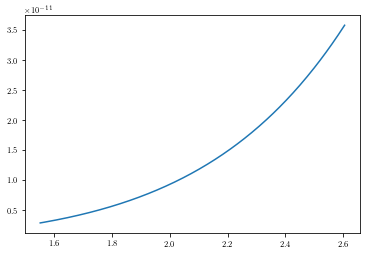

In [194]:
plt.plot(
    hbarws,
    ret_fit_scat_1(hbarws, 10, 0.06, 1, 40)
)

In [195]:
#+++++++++++++++++++++++++++++++++++++++++++++

def cost_func(params, *args):
    x=args[0]
    y=args[1]

    eps_inf=params[0]
    w_p=params[1]
    gamma=params[2]
    a = params[3]
    
    yfit=ret_fit_scat_1(x,*params)
    
    y_normed = y/y.max()
    yfit_normed = yfit/yfit.max()

    return (y_normed-yfit_normed).ravel()

In [196]:
cost_func(ini_guess_both, *args).shape

(274,)

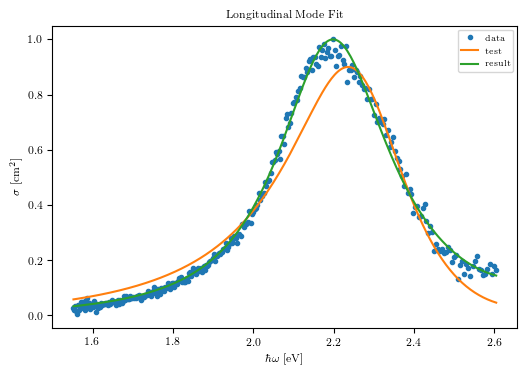

In [258]:
#+++++++++++++++++++++++++++++++++++++++++++++

ini_guess_both=np.array([11.6817827 ,  9.56022562,  5.8554153, 45.24119972])
# ini_guess_both=np.array([15.14244193,  8.4634295 , -0.16462349, 64.3292537 , 28.24427368])
params0=ini_guess_both   #parameter guess

args=[hbarws, AuNP_DFSpec[1],]
# for c in Ts:
#   args.append(c) 
args=tuple(args)   #doesn't work if args is a list!!

result=opt.least_squares(
    cost_func, 
    params0, 
    ftol=1e-15,
    xtol=1e-15, 
    gtol=1e-15, 
    args=args,
#     bounds=(0, np.inf),
#     x_scale=[10,1,1E-2,10],
    )
                         
#+++++++++++++++++++++++++++++++++++++++++++++
fit_result = ret_fit_scat_1(hbarws, *result['x'])
norm_fit_result = fit_result/fit_result.max()

higher_damp = result['x'].copy()
higher_damp[2] = 0.22
higher_damp[3] = 44

high_damp_result = ret_fit_scat_1(hbarws, *higher_damp)

data = AuNP_DFSpec[1]
norm_data = data/data.max()

plt.figure(dpi=100)
plt.plot(hbarws, norm_data, label='data', ls=' ', marker='.')
# plt.plot(hbarws, ret_fit_scat_1(hbarws, *ini_guess_both),label='initial', ls='--')
plt.plot(hbarws, 0.9*high_damp_result/high_damp_result.max(),label='test', ls='-')
plt.plot(hbarws, norm_fit_result,label='result', ls='-')

# plt.xlim([np.min(long_hbarws),np.max(trans_hbarws)])
plt.xlabel(r'$\hbar\omega$ [eV]')
plt.ylabel(r'$\sigma$ [cm$^2$]')
plt.title(r'Longitudinal Mode Fit')
plt.legend()

# plt.figure(dpi=100)
# plt.plot(trans_hbarws, trans_sigma, label='data', ls=' ', marker='.')
# plt.plot(trans_hbarws, ret_fit_scat_2(trans_hbarws, *ini_guess_both), label='initial', ls='--')
# plt.plot(trans_hbarws, ret_fit_scat_2(trans_hbarws, *result['x'])*1e-10, label='result', ls='-')
# plt.xlim([np.min(long_hbarws), np.max(trans_hbarws)])
# plt.xlabel(r'$\hbar\omega$ [eV]')
# plt.ylabel(r'$\sigma$ [cm$^2$]')
# plt.title(r'Transverse Mode Fit')
# plt.legend()

In [219]:
result['x']

array([28.3600007 , 13.77478923, -0.35716016, 56.1865231 ])

Results for damping don't make any sense, but i guess i can roll with it for now. Curly says the sphere should be 80nm. Could the glass substrate be the problem here?

Can try fitting image 2692

processing figure 2692


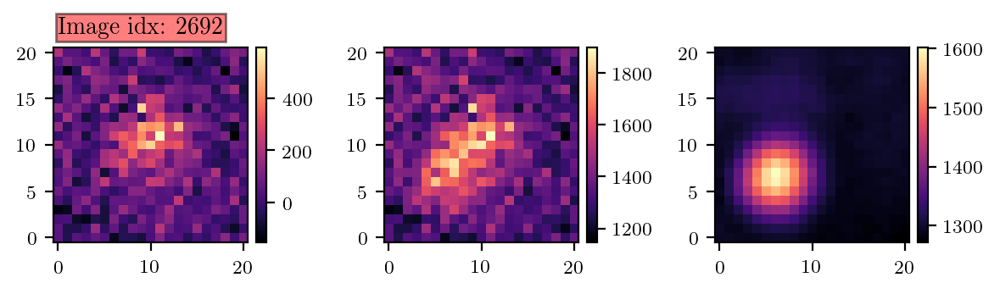

In [222]:

for i in [2]:

    print(f'processing figure {i}')
    
    fig, axs = plt.subplots(
        ncols=3,
        dpi=200,
        figsize=(6,2)
        
        )
    
    for ax_idx, name in zip(
        [0,1,2], ["bgsub_img", "raw_img", "bg_img"]):

        img1 = axs[ax_idx].imshow(mat_images[name][...,i])
        if ax_idx is 0:
            axs[ax_idx].text(
                0, 22, f'Image idx: {i}', 
                style='italic',
                bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 1}
                   )
        ## Add colorbar
        divider = make_axes_locatable(axs[ax_idx])
        cax1 = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(img1, cax=cax1)
   
    plt.tight_layout(h_pad=1)
    

In [230]:
np.argwhere(np.array(img_idxs_w_plas) == 2692.)

array([[223]])

In [232]:
gauss_fit_to_bgsub_2692=gauss_fit_params_w_plas_back[223]
gauss_fit_to_bg_2692=plas_back_fit_params[223]


In [233]:
gauss_fit_to_bg_2692['x']

array([1.97559299e-01, 3.19020825e+02, 2.93995862e+02, 1.25619106e+02,
       1.14098089e+02, 4.64646924e+02, 8.09788579e-01])

In [243]:
RealFittingTools.twoD_Gaussian(
        exp_obs_pts[1]/m_per_nm, exp_obs_pts[2]/m_per_nm,
        *gauss_fit_to_bg_2692['x']
        ).shape

(21,)

processing figure 2692


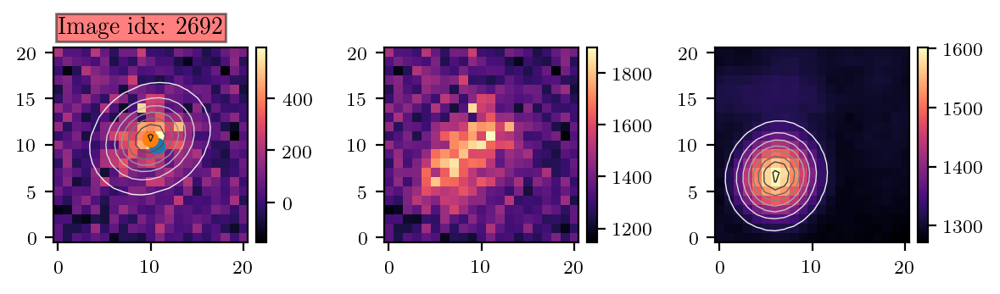

In [620]:

for i in [2692]:

    print(f'processing figure {i}')
    
    fig, axs = plt.subplots(
        ncols=3,
        dpi=200,
        figsize=(6,2)
        
        )
    
    for ax_idx, name in zip(
        [0,1,2], ["bgsub_img", "raw_img", "bg_img"]):

        img1 = axs[ax_idx].imshow(mat_images[name][...,i],)
        if ax_idx is 0:
            axs[ax_idx].text(
                0, 22, f'Image idx: {i}', 
                style='italic',
                bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 1}
                   )
        ## Add colorbar
        divider = make_axes_locatable(axs[ax_idx])
        cax1 = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(img1, cax=cax1)
   
    plt.tight_layout(h_pad=1)
    

axs[0].contour(
    range(0,21),
    range(0,21),
    RealFittingTools.twoD_Gaussian(
        None,
        (exp_obs_pts[1]/m_per_nm, exp_obs_pts[2]/m_per_nm),
        *gauss_fit_to_bgsub_2692['x']
        ).reshape(exp_obs_pts[1].shape),
    cmap='Greys',
    linewidths=0.5,
    )
    
    
axs[2].contour(
    range(0,21),
    range(0,21),
    RealFittingTools.twoD_Gaussian(
        None,
        (exp_obs_pts[1]/m_per_nm, exp_obs_pts[2]/m_per_nm),
        *gauss_fit_to_bg_2692['x']
        ).reshape(exp_obs_pts[1].shape),
    cmap='Greys',
    linewidths=0.5,
    )

axs[0].scatter(*(gauss_fit_to_bgsub_2692['x'][1:3]/48))
axs[0].scatter(*(gauss_fit_to_bgsub_2692['x'][2:0:-1]/48))

In [ ]:
3.19020825e+02, 2.93995862e+02

It might be an issue that my plasmon has always been centered before now...

I need a model that allows me to specify
- plas position
    - (x, y)
- spherical plas paramters
    - (radius, eps_inf, w_plasma, gamma_nr)
- dipole parameters
    - (w_res, gamma)

and fits 
- mol position
    - (x, y)
    - orientation: (phi, [and maybe theta])

In [334]:

class SphDipoleProperties(object):
    """ Will eventually call parameter file as argument, currently (02/07/19)
        just loads relevant values from hardcoded paths. ew.
        """


    def __init__(self,
        plas_fit_params=[28.3600007 , 13.77478923, -0.35716016, 56.1865231],
        fluo_fit_params=[2.24403839, 0.13499613],
        eps_b=eps_b,
        fluo_quench_region_nm=10,
        isolate_mode=None,
        ):

        drive_energy_eV = 2.24403839
        
        ## Assign plas fit parameters
        eps_inf=plas_fit_params[0]
        hbar_omega_plasma=plas_fit_params[1]
        hbar_gamma_drude=plas_fit_params[2]
        a_in_nm = plas_fit_params[3]
    
        ## Assign fluo fit parameters
        fluo_ext_coef=70000 
        ## from https://www.thermofisher.com/order/catalog/product/D6180
        fluo_hw_res = fluo_fit_params[0]
        fluo_nr_hbar_gamma=fluo_fit_params[1]
    
        self.drive_energy_eV = drive_energy_eV
        self.eps_inf = eps_inf
#         print(f"plas_fit_params = {plas_fit_params[1]}")
        self.omega_plasma = hbar_omega_plasma / hbar
        self.gamma_drude = hbar_gamma_drude / hbar
        self.a_meters = a_in_nm * m_per_nm

        self.eps_b = eps_b

        ## hardcoded region around nanoparticle to through out results because
        ## dipole approximation at small proximities
        self.fluo_quench_range = fluo_quench_region_nm

        self.alpha0_diag_dyad = cpc.sparse_polarizability_tensor(
            cpc.fluorophore_mass(70000, fluo_nr_hbar_gamma/hbar), 
            w_res=fluo_hw_res/hbar, 
            w=drive_energy_eV/hbar, 
            gamma_nr=fluo_nr_hbar_gamma/hbar, 
            a=0, 
            eps_inf=0, 
            ebs_b=eps_b,
            )
        
        self.alpha1_diag_dyad = (
            cpc.sparse_ret_sphere_polarizability_Drude(
                w=drive_energy_eV/hbar,
                eps_inf=self.eps_inf, 
                w_p= self.omega_plasma, 
                gamma=self.gamma_drude,
                eps_b=eps_b, 
                a=self.a_meters, 
                isolate_mode=None
                ))
                


In [484]:
class CoupledDipoles(SphDipoleProperties, fit.FittingTools):

    ## Q: do I need to manually call 'PlottingStuff.__init__'?
    def __init__(self,
        obs_points=None,
#         isolate_mode=None,
        drive_energy_eV=2.44,
        ):
        """
        PlottingStuff.__init__(): Really just calls DipoleProperties.__init__()
            which initializes polarizabilities and maybe some other stuff

        FittingTools.__init__(obs_points): defines obs points or assigns
            default
         """
        
        if obs_points is None: 
            obs_points = exp_obs_pts
            
        SphDipoleProperties.__init__(self,
#             isolate_mode=isolate_mode,
#             drive_energy_eV=drive_energy_eV,
            )
        fit.FittingTools.__init__(self, obs_points)

    def mb_p_fields(self, dipole_mag_array, dipole_coordinate_array):
        ''' Evaluates analytic form of focused+diffracted dipole fields
            anlong observation grid given

            Args
            ----
                dipole_mag_array: array of dipole moment vecotrs
                    with shape ~(n dipoles, 3 cartesean components)
                dipole_coordinate_array: same shape structure but
                    the locations of the dipoles.

            Returns
            -------
                Fields with shape ~ (3, ?...)



            '''

        p = dipole_mag_array
        # print('Inside mb_p_fields, p= ',p)
        bfx = dipole_coordinate_array

        v_rel_obs_x_pts = (self.obs_points[1].ravel()[:,None] - bfx.T[0]).T
        v_rel_obs_y_pts = (self.obs_points[2].ravel()[:,None] - bfx.T[1]).T

        px_fields = np.asarray(
            afi.E_field(
                0,
                v_rel_obs_x_pts,
                v_rel_obs_y_pts,
                (self.drive_energy_eV/hbar)*np.sqrt(self.eps_b)/c
                )
            )
        py_fields = np.asarray(
            afi.E_field(
                np.pi/2,
                v_rel_obs_x_pts,
                v_rel_obs_y_pts,
                (self.drive_energy_eV/hbar)*np.sqrt(self.eps_b)/c
                )
            )
        # This is not true, but does not matter as long as no dipoles have
        # z components.
        pz_fields = np.zeros(py_fields.shape)

        ## returns [Ex, Ey, Ez] for dipoles oriented along cart units

        Ex = (
            p[:,0,None]*px_fields[0]
            +
            p[:,1,None]*py_fields[0]
            +
            p[:,2,None]*pz_fields[0]
            )
        Ey = (
            p[:,0,None]*px_fields[1]
            +
            p[:,1,None]*py_fields[1]
            +
            p[:,2,None]*pz_fields[1]
            )
        Ez = (
            p[:,0,None]*px_fields[2]
            +
            p[:,1,None]*py_fields[2]
            +
            p[:,2,None]*pz_fields[2]
            )

        return np.array([Ex,Ey,Ez])


    def dipole_fields(
        self, 
        locations, 
        mol_angle=0, 
        plas_angle=np.pi/2, 
        plas_centroid=[0, 0]
        ):
        """ Calculate image fields of coupled plasmon and molecule
            dipole.

            Args
            ----


            Returns
            -------
            [mol_E, plas_E, p0_unc_E, p0, p1]
            """
        d = locations*m_per_nm
        plas_loc = np.asarray(plas_centroid)*m_per_nm
        p0, p1 = cpc.dipole_mags_gened(
            mol_angle,
            plas_angle,
            d_col=d,
            E_d_angle=None,
            alpha0_diag=self.alpha0_diag_dyad,
            alpha1_diag=self.alpha1_diag_dyad,
            )
        mol_E = self.mb_p_fields(
            dipole_mag_array=p0,
            dipole_coordinate_array=d+plas_loc,
            )
        
        plas_E = self.mb_p_fields(
            dipole_mag_array=p1,
            dipole_coordinate_array=plas_loc,
            )

        # p0_unc, = cpc.uncoupled_p0(mol_angle=0, d_col=d[0,None], E_d_angle=None)
        p0_unc, = cpc.uncoupled_p0(
            mol_angle,
            E_d_angle=None,
            drive_hbar_w=self.drive_energy_eV,
            )
    #     print('p0.shape = ',p0.shape)
    #     print('p1.shape = ',p1.shape)
    #     print('p0_unc.shape = ',p0_unc.shape)
    #     p0_unc_E = self.mb_p_fields(dipole_mag_array=p0_unc[None,:], dipole_coordinate_array=np.zeros(d[0][None,:].shape))
        if type(mol_angle)==np.ndarray and mol_angle.shape[0]>1:
            p0_unc_E = self.mb_p_fields(
                dipole_mag_array=p0_unc,
                dipole_coordinate_array=d
                )
        elif (type(mol_angle) == int or
              type(mol_angle) == float or
              type(mol_angle) == np.float64 or
              (type(mol_angle) == np.ndarray and mol_angle.shape[0]==1)
              ):
            p0_unc_E = self.mb_p_fields(
                dipole_mag_array=p0_unc[None,:],
                dipole_coordinate_array=d,
                )
#         print(type(mol_angle))
        return [mol_E, plas_E, p0_unc_E, p0, p1]



In [715]:
cp_inst=CoupledDipoles()

for i in np.arange(20, 300, 20):
    field_output = cp_inst.dipole_fields(
            np.array([[0,i, 0]]), 
            mol_angle=np.pi/2, 
            plas_angle=np.pi/2, 
            plas_centroid=np.array([[400, 350, 0]])
            )
    a_coup_image = cp_inst.image_from_E(field_output[0]+field_output[1])


    
    plt.figure()
    ax=plt.axes()
    
    img = ax.imshow( 
        a_coup_image.reshape(21,21).T, origin='lower',
        extent=[0-48/2, 48*21-48/2, 0-48/2, 48*21-48/2])

    ax.scatter(400, 350)
    
    ax.scatter(0+400, i+350, c='green')
    plt.colorbar(img)
    plt.show()
    

In [705]:
def image_from_params(
    params, 
    plas_loc,
    resolution=None,
    ):
    """ 
        Args
        ----
        
        params = [
            d=[x, y, z], : mol location relative to plasmon
            phi, : mole angle
            ]
    
        """
    dx = params[0]
    dy = params[1]
    phi = params[2]
    
    if resolution is None:
        obs_pts = None
    else:
        obs_pts = diffi.observation_points(
            0, 48*20*m_per_nm, 0, 48*20*m_per_nm, resolution)
        
    cp_inst=CoupledDipoles(obs_points=obs_pts)
    field_output = cp_inst.dipole_fields(
            np.array([[dx, dy, 0]]), 
            mol_angle=phi, 
            plas_angle=0, 
            plas_centroid=np.array([plas_loc])
            )
    raveled_image = cp_inst.image_from_E(field_output[0]+field_output[1])
    
    return raveled_image
    
    
def fit_image_w_coupled_model(image, plas_loc, ini_guess_params=None):
    """
        """
    data = image
    model = lambda params: image_from_params(params, plas_loc)
    
#     cost_func = 
    if ini_guess_params is None: 
        ini_guess_params = (100, 100, 0)
    
    fit_result = opt.least_squares(
        lambda fit_params: (
            data.ravel()/data.max() 
            - 
            model(fit_params).ravel()/ model(fit_params).max()
            ),
        ini_guess_params,
        x_scale=[1E2,1E2,1],
        loss='soft_l1'
        )
    
    return fit_result


In [706]:
a_plas_loc = [3.19020825e+02, 2.93995862e+02, 0]

In [707]:
resuuuult = fit_image_w_coupled_model(
    mat_images['bgsub_img'][...,2692].ravel(), 
    a_plas_loc)

In [708]:
resuuuult['x']

array([187.17682044, 168.13055502,   0.98010925])

In [709]:
high_res_obs_pts = diffi.observation_points(
    0, 48*20*m_per_nm, 0, 48*20*m_per_nm, 201)

processing figure 2692


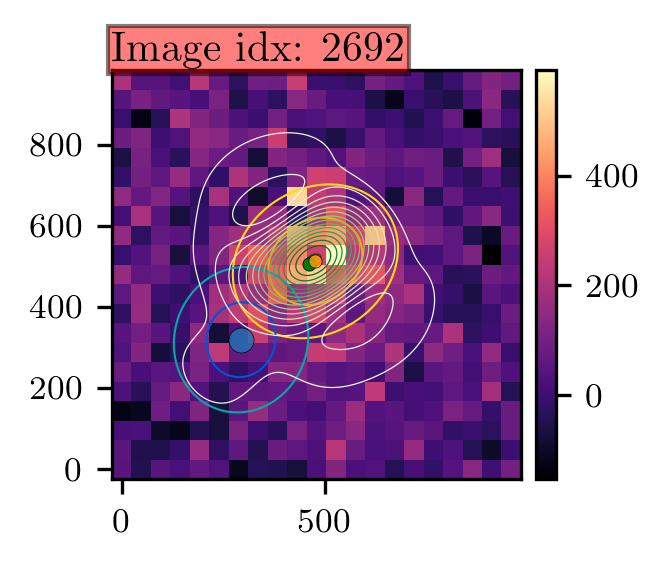

In [710]:

for i in [2692]:

    print(f'processing figure {i}')
    
    fig, axs = plt.subplots(
        ncols=1,
        dpi=300,
        figsize=(6,2)
        )
    
    axs = [axs]
    
    for ax_idx, name in zip(
        [0,1,2], ["bgsub_img", "raw_img", "bg_img"]):
        
        if ax_idx is 1: break
        
        img1 = axs[ax_idx].imshow(
            mat_images[name][...,i],
            origin='lower',
            extent=[0-48/2, 48*21-48/2, 0-48/2, 48*21-48/2]
            )
        if ax_idx is 0:
            axs[ax_idx].text(
                0, 1, f'Image idx: {i}', 
                style='italic',
                bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 1},
                transform=axs[0].transAxes,
                verticalalignment='bottom'
                )
        ## Add colorbar
        divider = make_axes_locatable(axs[ax_idx])
        cax1 = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(img1, cax=cax1)
   
    plt.tight_layout(h_pad=1)
    

axs[0].contour(
    np.linspace(0,48*(21-1), 201),
    np.linspace(0,48*(21-1), 201),
    RealFittingTools.twoD_Gaussian(
        None,
        (high_res_obs_pts[1]/m_per_nm, high_res_obs_pts[2]/m_per_nm),
        *gauss_fit_to_bgsub_2692['x']
        ).reshape(high_res_obs_pts[1].shape),
    cmap='Wistia',
    linewidths=0.5,
    levels=2
    )
    
    
axs[0].contour(
    np.linspace(0,48*(21-1), 201),
    np.linspace(0,48*(21-1), 201),
    RealFittingTools.twoD_Gaussian(
        None,
        (high_res_obs_pts[1]/m_per_nm, high_res_obs_pts[2]/m_per_nm),
        *gauss_fit_to_bg_2692['x']
        ).reshape(high_res_obs_pts[1].shape),
    cmap='winter_r',
    linewidths=0.5,
    levels=2
    )

axs[0].contour(
    np.linspace(0,48*(21-1),201),
    np.linspace(0,48*(21-1),201),
    (image_from_params(
        resuuuult['x'], 
        a_plas_loc,
        resolution=201
        )).reshape(201,201),
    cmap='Greens',
    linewidths=0.3,
    levels=16
    )

## Mark centroids
axs[0].scatter(
    a_plas_loc[1], 
    a_plas_loc[0], 
    zorder=5,
    alpha=.8,
    edgecolor='k',
    linewidth=.2
    )

axs[0].scatter(
    resuuuult['x'][1]+a_plas_loc[1], 
    resuuuult['x'][0]+a_plas_loc[0], 
    zorder=5,
    s = 10,
    c='green',
    edgecolor='k',
    linewidth=.2
    )

axs[0].scatter(
    gauss_fit_to_bgsub_2692['x'][2], 
    gauss_fit_to_bgsub_2692['x'][1], 
    zorder=5,
    s = 10,
    c='orange',
    alpha=.8,
    edgecolor='k',
    linewidth=.2
    )


## Build full machinery to make fit plots 

In [711]:
def get_gauss_fit_parms(img_idx):
    
    w_plas_idx = int(np.argwhere(np.array(img_idxs_w_plas) == img_idx))

    bgsub_fit_params = gauss_fit_params_w_plas_back[w_plas_idx]
    bg_fit_params = plas_back_fit_params[w_plas_idx]
    
    return bgsub_fit_params, bg_fit_params

def fit_coup_model_to_imgidx(img_idx):
    
#     if the_plas_loc is None:
        
    bgsub_fit, bg_fit = get_gauss_fit_parms(img_idx)

    the_plas_loc = [
        bg_fit['x'][1],
        bg_fit['x'][2],
        0
        ]

#     super_res_loc = [
#         bgsub_fit['x'][2],
#         bgsub_fit['x'][1],
#         0
#         ]
    
    model_fit_params = fit_image_w_coupled_model(
        mat_images['bgsub_img'][...,img_idx].ravel(), 
        plas_loc=the_plas_loc,
        ini_guess_params=[
            bgsub_fit['x'][1]-bg_fit['x'][1],
            bgsub_fit['x'][2]-bg_fit['x'][2],
            0
            ]
        )
    
    return model_fit_params

processing figure 1250

 Super res fit = (479.03, 471.52)

 Model fit  = (481.37, 480.00) @ angle phi = 0.12

 difference in loc = 8.80 nm 

processing figure 2692

 Super res fit = (477.26, 512.30)

 Model fit  = (462.13, 506.20) @ angle phi = 0.98

 difference in loc = 16.32 nm 



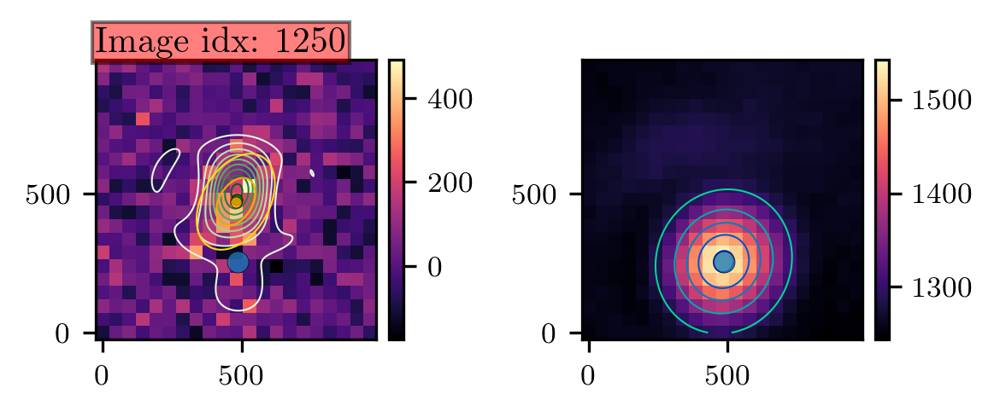

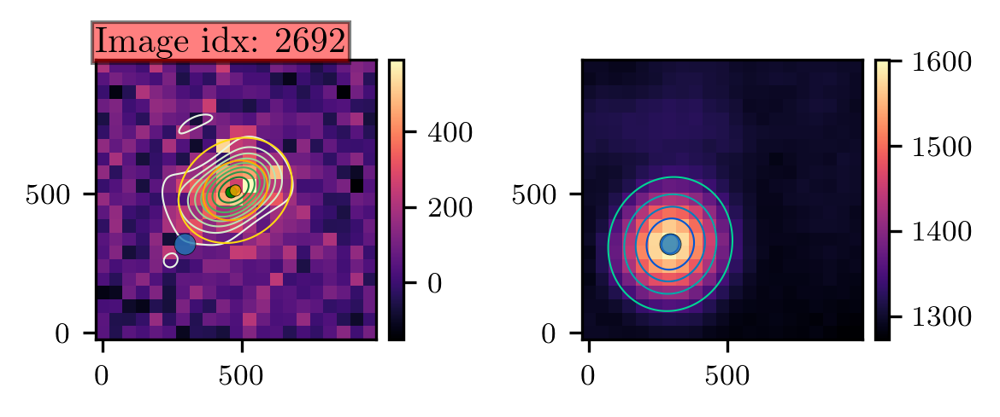

In [712]:

for i in [
    1250,
    2692,
    ]:

    print(f'processing figure {i}')
    
    ## Get gaussian fit params
    img_gauss_fit, bgimg_gauss_fit = get_gauss_fit_parms(i)
    
    plas_loc=[bgimg_gauss_fit['x'][1], bgimg_gauss_fit['x'][2], 0]
    
    ## Fit model
    model_fit = fit_coup_model_to_imgidx(
        i, 
#         plas_loc
        )
    
    ## Build figure
    fig, axs = plt.subplots(
        ncols=2,
        dpi=300,
        figsize=(4,2)
        )
    
    ## Be lazy about converting from subplots to single plot syntax
#     axs = [axs]
    
    for ax_idx, name in zip(
        [0,1], ["bgsub_img", "bg_img"]):
        
        ## But really only do the first
#         if ax_idx is 1: continue
        
        img1 = axs[ax_idx].imshow(
            mat_images[name][...,i],
            origin='lower',
            extent=[0-48/2, 48*21-48/2, 0-48/2, 48*21-48/2]
            )
        if ax_idx is 0:
            axs[ax_idx].text(
                0, 1, f'Image idx: {i}', 
                style='italic',
                bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 1},
                transform=axs[0].transAxes,
                verticalalignment='bottom'
                )
        ## Add colorbar
        divider = make_axes_locatable(axs[ax_idx])
        cax1 = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(img1, cax=cax1)
   
    plt.tight_layout(h_pad=1)
    

    ## Contour model fit
    axs[0].contour(
        np.linspace(0,48*(21-1),201),
        np.linspace(0,48*(21-1),201),
        (image_from_params(
            model_fit['x'], 
            plas_loc,
            resolution=201
            )).reshape(201,201),
        cmap='Greens',
        linewidths=0.5,
        levels=10
        )

    ## Scatter plasmon location 
    for i in [0,1]:
        axs[i].scatter(
            *plas_loc[1::-1], 
            zorder=5,
            alpha=.8,
            edgecolor='k',
            linewidth=.2
            )

    ## Scatter mol location
    axs[0].scatter(
        plas_loc[1]+model_fit['x'][1], 
        plas_loc[0]+model_fit['x'][0], 
        zorder=5,
        s = 10,
        c='green',
        edgecolor='k',
        linewidth=.2
        )

    ## Scatter standard super res loc
    axs[0].scatter(
        img_gauss_fit['x'][2],
        img_gauss_fit['x'][1],
        zorder=5,
        s = 10,
        c='orange',
        alpha=.8,
        edgecolor='k',
        linewidth=.2
        )

    ## Contour Gaussians
    axs[0].contour(
        np.linspace(0,48*(21-1), 201),
        np.linspace(0,48*(21-1), 201),
        RealFittingTools.twoD_Gaussian(
            None,
            (high_res_obs_pts[1]/m_per_nm, high_res_obs_pts[2]/m_per_nm),
            *img_gauss_fit['x']
            ).reshape(high_res_obs_pts[1].shape),
        cmap='Wistia',
        linewidths=0.5,
        levels=2
        )


    axs[1].contour(
        np.linspace(0,48*(21-1), 201),
        np.linspace(0,48*(21-1), 201),
        RealFittingTools.twoD_Gaussian(
            None,
            (high_res_obs_pts[1]/m_per_nm, high_res_obs_pts[2]/m_per_nm),
            *bgimg_gauss_fit['x']
            ).reshape(high_res_obs_pts[1].shape),
        cmap='winter_r',
        linewidths=0.5,
        levels=5
        )

    print(f"\n Super res fit = ({img_gauss_fit['x'][2]:.2f}, {img_gauss_fit['x'][1]:.2f})\n")

    print(f" Model fit  = ({plas_loc[1]+model_fit['x'][1]:.2f}, "
          +f"{plas_loc[0]+model_fit['x'][0]:.2f}) @ angle phi = {model_fit['x'][2]:.2f}\n")


    difference_in_loc = (
        (plas_loc[1]+model_fit['x'][1] - img_gauss_fit['x'][2])**2.
        + 
        (plas_loc[0]+model_fit['x'][0] - img_gauss_fit['x'][1])**2.
        )**0.5
    print(f" difference in loc = {difference_in_loc:.2f} nm \n")


# Try some more,



 processing figure 2640
-----------------------------

 Super res fit = (571.31, 279.95)

 Model fit  = (561.69, 298.31) @ angle phi = 0.54
with d = (293.23, -255.89)

Difference in loc = 20.73 nm 



 processing figure 2571
-----------------------------

 Super res fit = (475.32, 484.29)

 Model fit  = (467.71, 469.02) @ angle phi = 1.22
with d = (344.64, -275.59)

Difference in loc = 17.05 nm 



 processing figure 2589
-----------------------------

 Super res fit = (482.99, 468.85)

 Model fit  = (478.29, 482.50) @ angle phi = -0.12
with d = (306.54, -262.02)

Difference in loc = 14.43 nm 



 processing figure 2571
-----------------------------

 Super res fit = (475.32, 484.29)

 Model fit  = (467.71, 469.02) @ angle phi = 1.22
with d = (344.64, -275.59)

Difference in loc = 17.05 nm 



 processing figure 2188
-----------------------------

 Super res fit = (466.91, 483.14)

 Model fit  = (471.50, 474.78) @ angle phi = -0.25
with d = (-61.46, 258.88)

Difference in loc = 9.54 

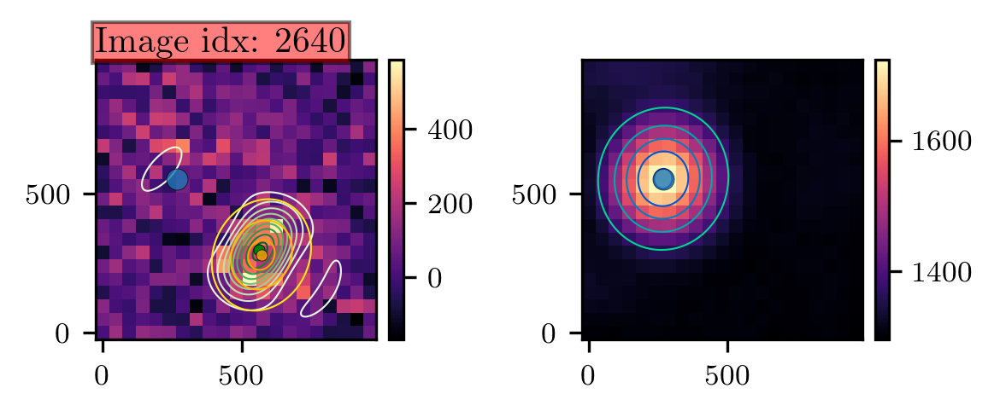

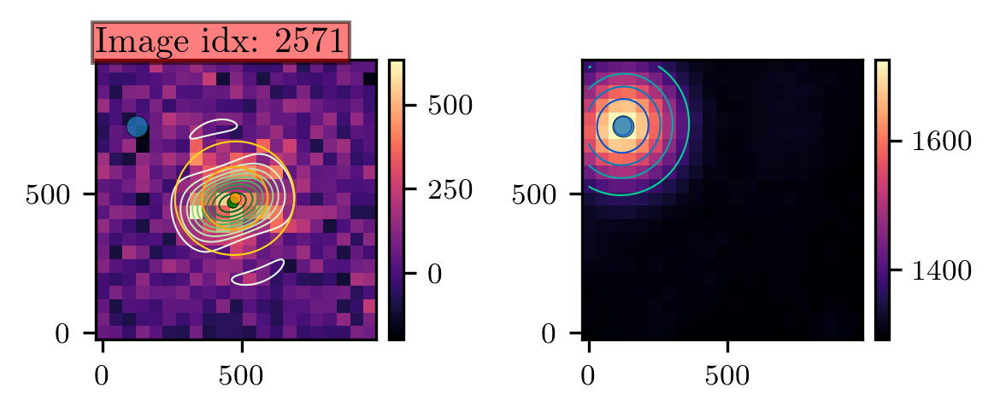

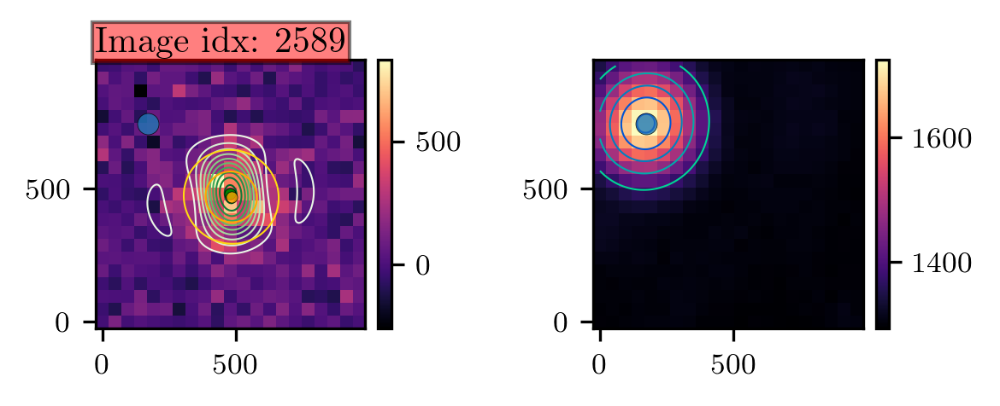

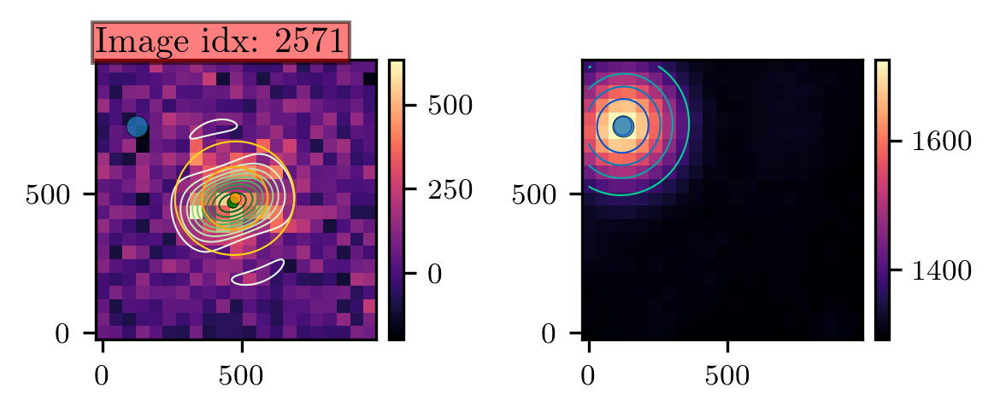

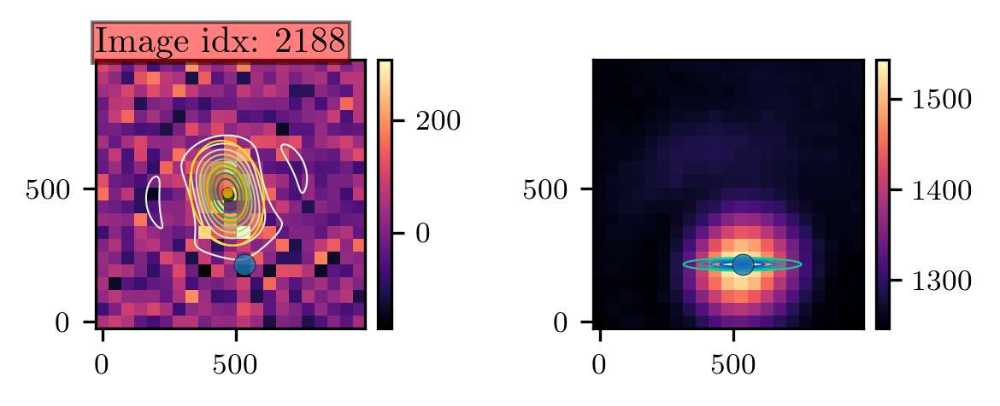

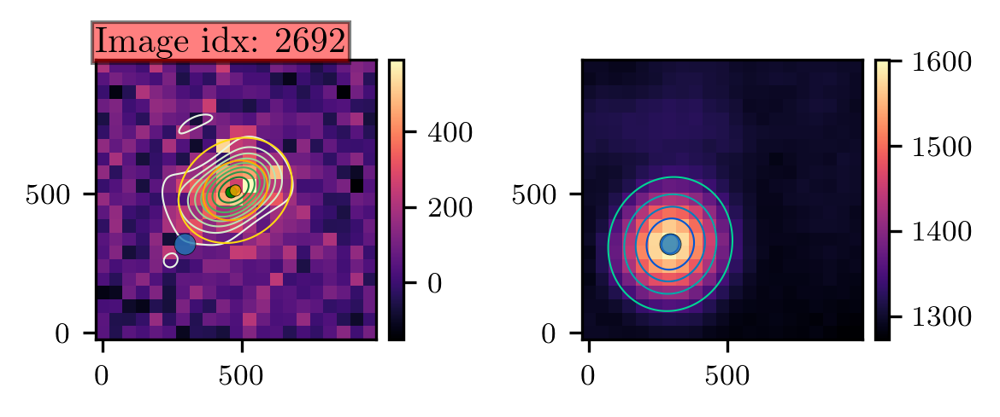

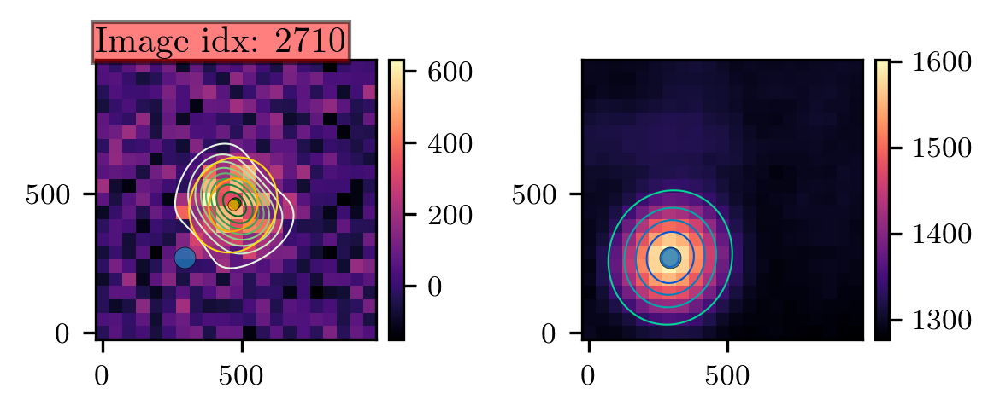

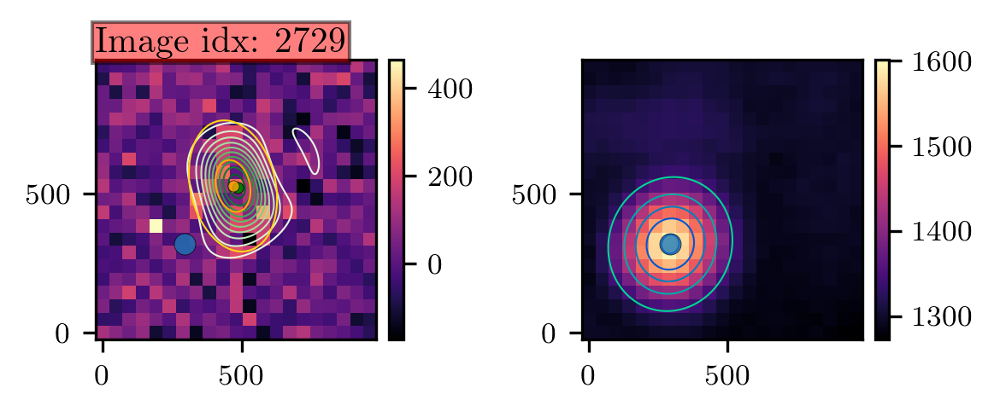

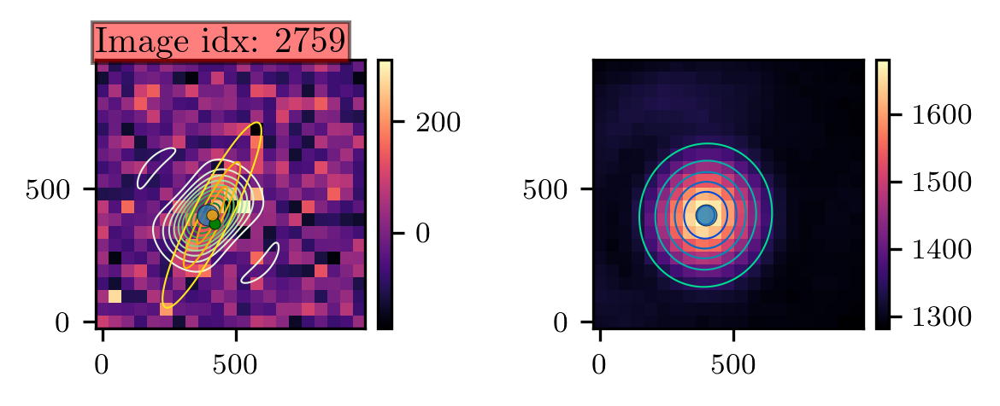

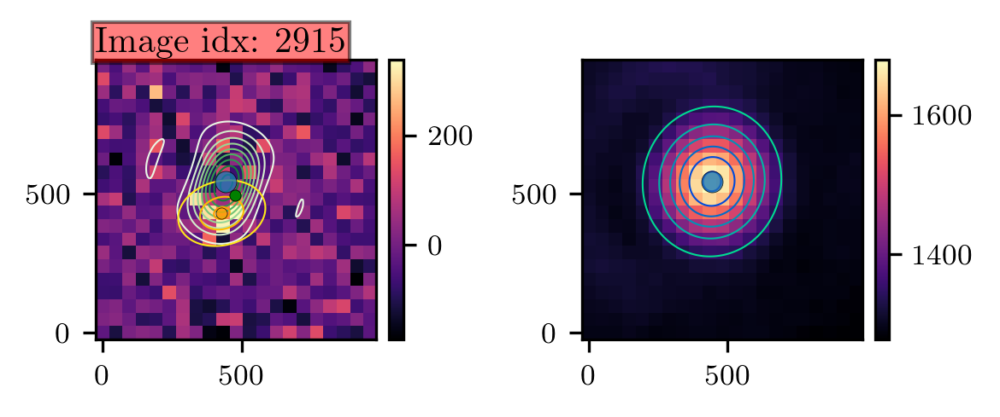

In [713]:

for i in [
    2640, 
    2571,
    2589,
    2571,
    2188,
    2692,
    2710,
    2729,
    2759,
    2915,
#     2692,
    ]:

    print(f'\n\n processing figure {i}\n'
         +'-----------------------------')
    
    ## Get gaussian fit params
    img_gauss_fit, bgimg_gauss_fit = get_gauss_fit_parms(i)
    
    plas_loc=[bgimg_gauss_fit['x'][1], bgimg_gauss_fit['x'][2], 0]
    
    ## Fit model
    model_fit = fit_coup_model_to_imgidx(
        i, 
#         plas_loc
        )
    
    ## Build figure
    fig, axs = plt.subplots(
        ncols=2,
        dpi=300,
        figsize=(4,2)
        )
    
    ## Be lazy about converting from subplots to single plot syntax
#     axs = [axs]
    
    for ax_idx, name in zip(
        [0,1], ["bgsub_img", "bg_img"]):
        
        ## But really only do the first
#         if ax_idx is 1: continue
        
        img1 = axs[ax_idx].imshow(
            mat_images[name][...,i],
            origin='lower',
            extent=[0-48/2, 48*21-48/2, 0-48/2, 48*21-48/2]
            )
        if ax_idx is 0:
            axs[ax_idx].text(
                0, 1, f'Image idx: {i}', 
                style='italic',
                bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 1},
                transform=axs[0].transAxes,
                verticalalignment='bottom'
                )
        ## Add colorbar
        divider = make_axes_locatable(axs[ax_idx])
        cax1 = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(img1, cax=cax1)
   
    plt.tight_layout(h_pad=1)


    ## Contour model fit
    axs[0].contour(
        np.linspace(0,48*(21-1),201),
        np.linspace(0,48*(21-1),201),
        (image_from_params(
            model_fit['x'], 
            plas_loc,
            resolution=201
            )).reshape(201,201),
        cmap='Greens',
        linewidths=0.5,
        levels=10
        )

    ## Scatter plasmon location 
    for i in [0,1]:
        axs[i].scatter(
            *plas_loc[1::-1], 
            zorder=5,
            alpha=.8,
            edgecolor='k',
            linewidth=.2
            )

    ## Scatter mol location
    axs[0].scatter(
        plas_loc[1]+model_fit['x'][1], 
        plas_loc[0]+model_fit['x'][0], 
        zorder=5,
        s = 10,
        c='green',
        edgecolor='k',
        linewidth=.2
        )

    ## Scatter standard super res loc
    axs[0].scatter(
        img_gauss_fit['x'][2],
        img_gauss_fit['x'][1],
        zorder=5,
        s = 10,
        c='orange',
        alpha=.8,
        edgecolor='k',
        linewidth=.2
        )

    ## Contour Gaussians
    axs[0].contour(
        np.linspace(0,48*(21-1), 201),
        np.linspace(0,48*(21-1), 201),
        RealFittingTools.twoD_Gaussian(
            None,
            (high_res_obs_pts[1]/m_per_nm, high_res_obs_pts[2]/m_per_nm),
            *img_gauss_fit['x']
            ).reshape(high_res_obs_pts[1].shape),
        cmap='Wistia',
        linewidths=0.5,
        levels=2
        )


    axs[1].contour(
        np.linspace(0,48*(21-1), 201),
        np.linspace(0,48*(21-1), 201),
        RealFittingTools.twoD_Gaussian(
            None,
            (high_res_obs_pts[1]/m_per_nm, high_res_obs_pts[2]/m_per_nm),
            *bgimg_gauss_fit['x']
            ).reshape(high_res_obs_pts[1].shape),
        cmap='winter_r',
        linewidths=0.5,
        levels=5
        )

    print(f"\n Super res fit = ({img_gauss_fit['x'][2]:.2f}, {img_gauss_fit['x'][1]:.2f})\n")

    print(f" Model fit  = ({plas_loc[1]+model_fit['x'][1]:.2f}, "
          +f"{plas_loc[0]+model_fit['x'][0]:.2f}) @ angle phi = {model_fit['x'][2]:.2f}\n"
          +f"with d = ({model_fit['x'][1]:.2f}, {model_fit['x'][0]:.2f})")


    difference_in_loc = (
        (plas_loc[1]+model_fit['x'][1] - img_gauss_fit['x'][2])**2.
        + 
        (plas_loc[0]+model_fit['x'][0] - img_gauss_fit['x'][1])**2.
        )**0.5
    print(f"\nDifference in loc = {difference_in_loc:.2f} nm \n")




 processing figure 2915
-----------------------------

 Super res fit = (428.87, 430.29)

 Model fit  = (477.53, 493.41) @ angle phi = -1.86
with d = (33.75, -51.14)

Difference in loc = 79.69 nm 



 processing figure 2759
-----------------------------

 Super res fit = (410.85, 400.56)

 Model fit  = (421.21, 368.31) @ angle phi = 0.96
with d = (25.45, -31.81)

Difference in loc = 33.87 nm 



 processing figure 2544
-----------------------------

 Super res fit = (456.34, 452.32)

 Model fit  = (407.69, 579.92) @ angle phi = -0.11
with d = (11.95, 83.67)

Difference in loc = 136.56 nm 



 processing figure 2508
-----------------------------

 Super res fit = (535.54, 837.43)

 Model fit  = (528.83, 760.30) @ angle phi = -0.19
with d = (90.43, 311.26)

Difference in loc = 77.42 nm 



 processing figure 2138
-----------------------------

 Super res fit = (-232.53, 53.42)

 Model fit  = (-219.55, -107.07) @ angle phi = 0.16
with d = (-610.16, -652.63)

Difference in loc = 161.01 n

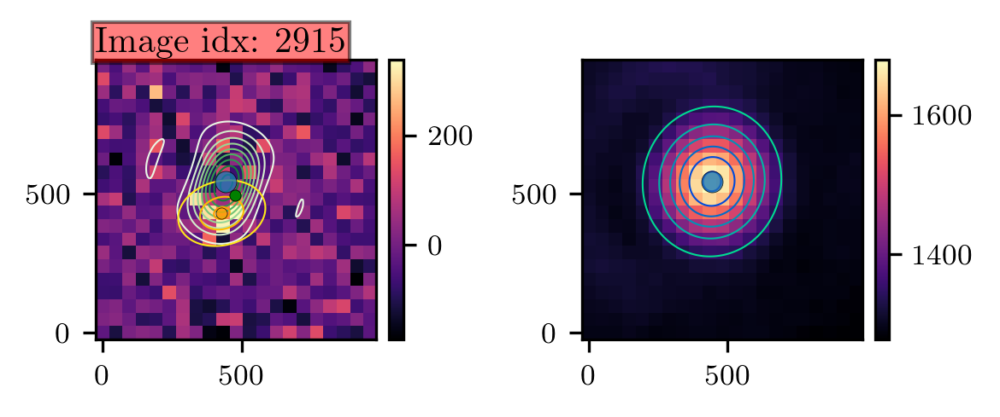

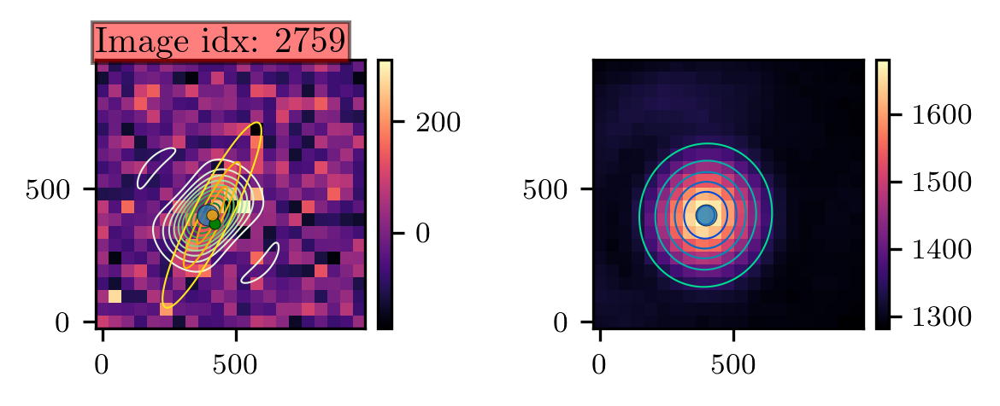

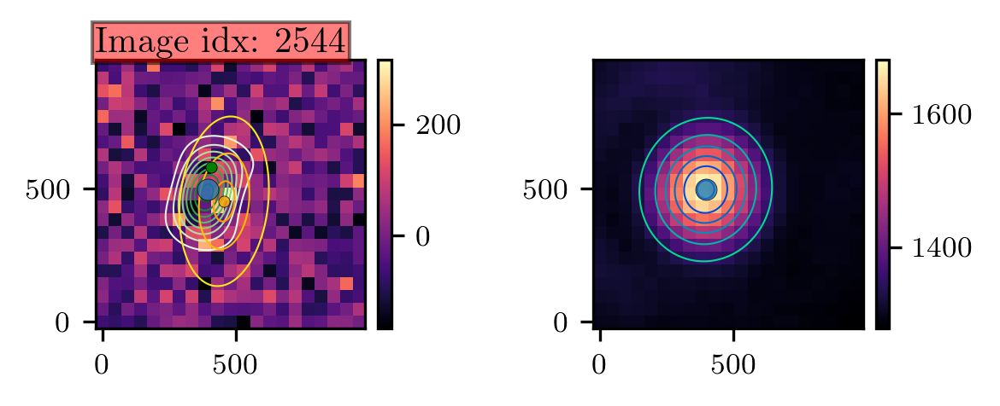

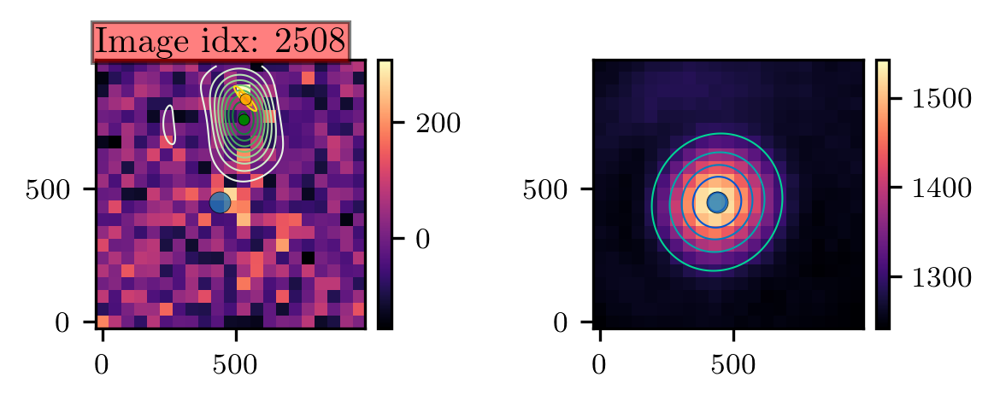

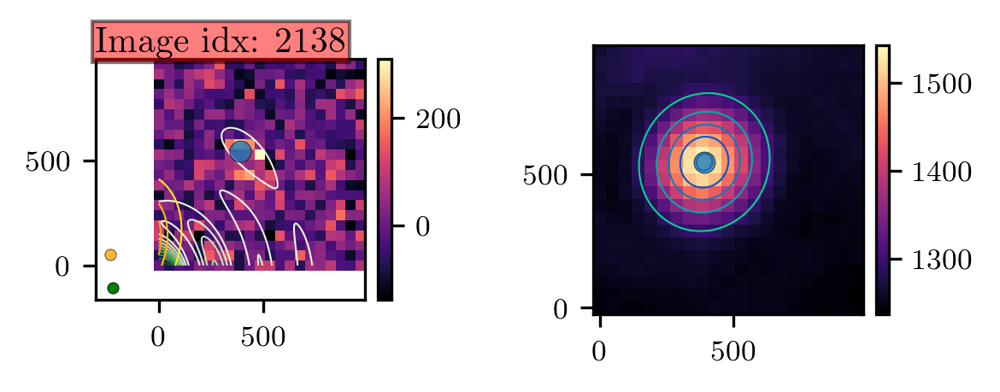

...

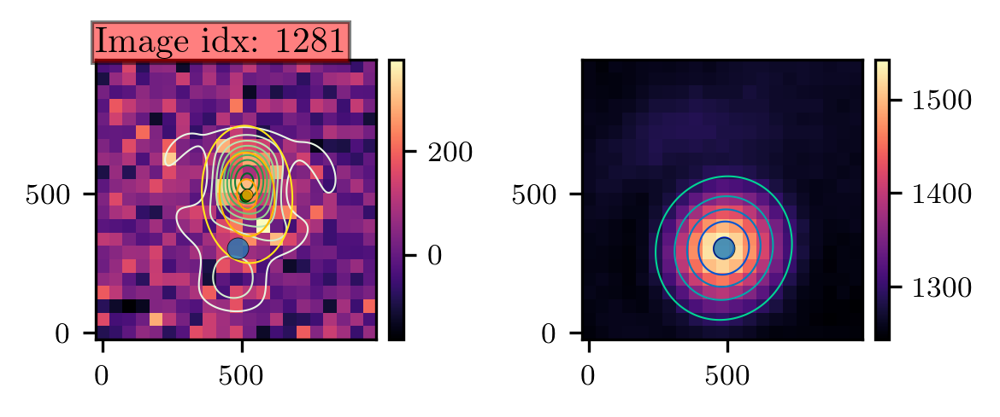

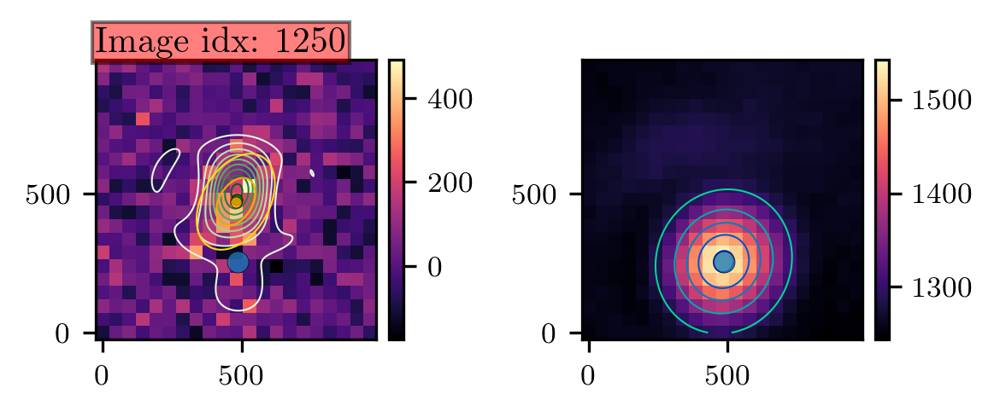

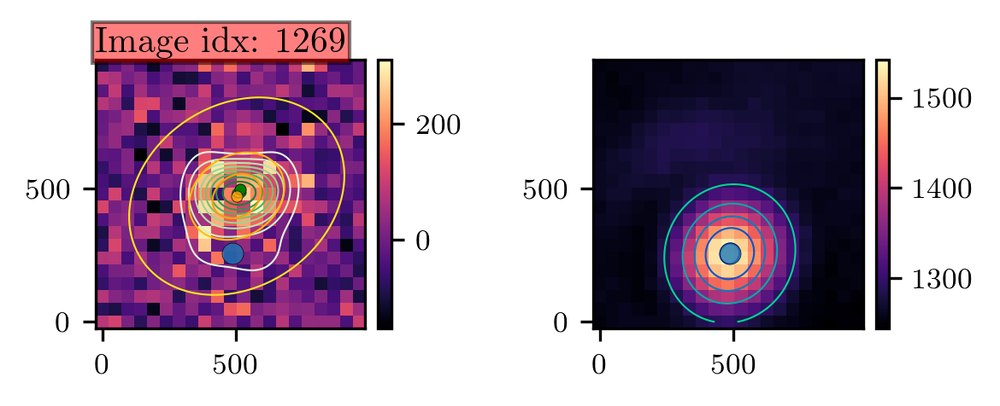

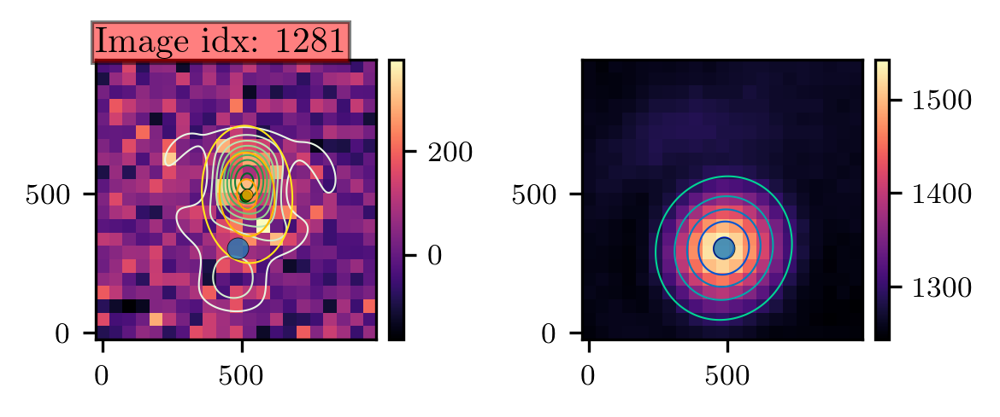

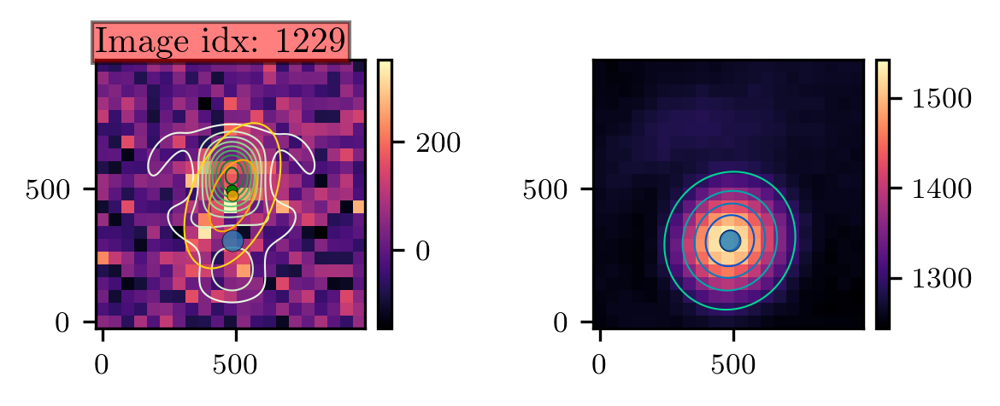

In [714]:

for i in [
    2915,
    2759,
    2544,
    2508,
    2138,
    1826,
    1692,
    1678,
    1641,
    1595,
    1542,
    1496,
    1460,
    1445,
    1300,
    1281,
    1250,
    1269,
    1281,
    1229
    ]:

    print(f'\n\n processing figure {i}\n'
         +'-----------------------------')
    
    ## Get gaussian fit params
    img_gauss_fit, bgimg_gauss_fit = get_gauss_fit_parms(i)
    
    plas_loc=[bgimg_gauss_fit['x'][1], bgimg_gauss_fit['x'][2], 0]
    
    ## Fit model
    model_fit = fit_coup_model_to_imgidx(
        i, 
#         plas_loc
        )
    
    ## Build figure
    fig, axs = plt.subplots(
        ncols=2,
        dpi=300,
        figsize=(4,2)
        )
    
    ## Be lazy about converting from subplots to single plot syntax
#     axs = [axs]
    
    for ax_idx, name in zip(
        [0,1], ["bgsub_img", "bg_img"]):
        
        ## But really only do the first
#         if ax_idx is 1: continue
        
        img1 = axs[ax_idx].imshow(
            mat_images[name][...,i],
            origin='lower',
            extent=[0-48/2, 48*21-48/2, 0-48/2, 48*21-48/2]
            )
        if ax_idx is 0:
            axs[ax_idx].text(
                0, 1, f'Image idx: {i}', 
                style='italic',
                bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 1},
                transform=axs[0].transAxes,
                verticalalignment='bottom'
                )
        ## Add colorbar
        divider = make_axes_locatable(axs[ax_idx])
        cax1 = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(img1, cax=cax1)
   
    plt.tight_layout(h_pad=1)


    ## Contour model fit
    axs[0].contour(
        np.linspace(0,48*(21-1),201),
        np.linspace(0,48*(21-1),201),
        (image_from_params(
            model_fit['x'], 
            plas_loc,
            resolution=201
            )).reshape(201,201),
        cmap='Greens',
        linewidths=0.5,
        levels=10
        )

    ## Scatter plasmon location 
    for i in [0,1]:
        axs[i].scatter(
            *plas_loc[1::-1], 
            zorder=5,
            alpha=.8,
            edgecolor='k',
            linewidth=.2
            )

    ## Scatter mol location
    axs[0].scatter(
        plas_loc[1]+model_fit['x'][1], 
        plas_loc[0]+model_fit['x'][0], 
        zorder=5,
        s = 10,
        c='green',
        edgecolor='k',
        linewidth=.2
        )

    ## Scatter standard super res loc
    axs[0].scatter(
        img_gauss_fit['x'][2],
        img_gauss_fit['x'][1],
        zorder=5,
        s = 10,
        c='orange',
        alpha=.8,
        edgecolor='k',
        linewidth=.2
        )

    ## Contour Gaussians
    axs[0].contour(
        np.linspace(0,48*(21-1), 201),
        np.linspace(0,48*(21-1), 201),
        RealFittingTools.twoD_Gaussian(
            None,
            (high_res_obs_pts[1]/m_per_nm, high_res_obs_pts[2]/m_per_nm),
            *img_gauss_fit['x']
            ).reshape(high_res_obs_pts[1].shape),
        cmap='Wistia',
        linewidths=0.5,
        levels=2
        )


    axs[1].contour(
        np.linspace(0,48*(21-1), 201),
        np.linspace(0,48*(21-1), 201),
        RealFittingTools.twoD_Gaussian(
            None,
            (high_res_obs_pts[1]/m_per_nm, high_res_obs_pts[2]/m_per_nm),
            *bgimg_gauss_fit['x']
            ).reshape(high_res_obs_pts[1].shape),
        cmap='winter_r',
        linewidths=0.5,
        levels=5
        )

    print(f"\n Super res fit = ({img_gauss_fit['x'][2]:.2f}, {img_gauss_fit['x'][1]:.2f})\n")

    print(f" Model fit  = ({plas_loc[1]+model_fit['x'][1]:.2f}, "
          +f"{plas_loc[0]+model_fit['x'][0]:.2f}) @ angle phi = {model_fit['x'][2]:.2f}\n"
          +f"with d = ({model_fit['x'][1]:.2f}, {model_fit['x'][0]:.2f})")


    difference_in_loc = (
        (plas_loc[1]+model_fit['x'][1] - img_gauss_fit['x'][2])**2.
        + 
        (plas_loc[0]+model_fit['x'][0] - img_gauss_fit['x'][1])**2.
        )**0.5
    print(f"\nDifference in loc = {difference_in_loc:.2f} nm \n")


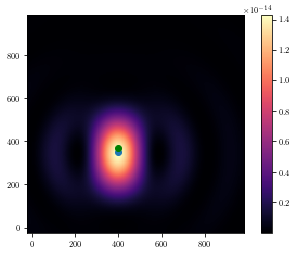

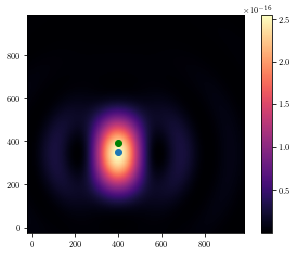

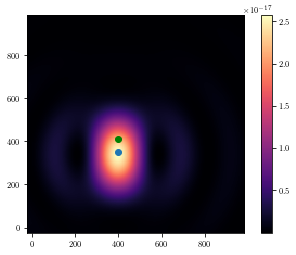

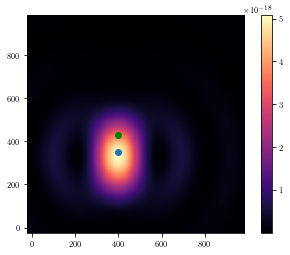

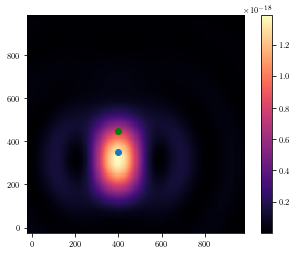

...

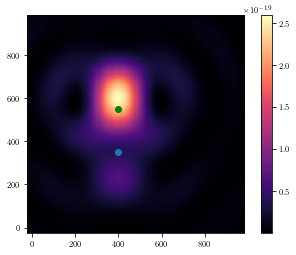

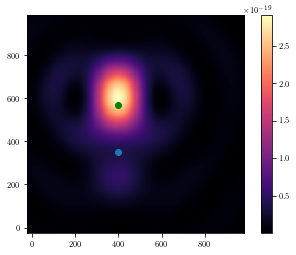

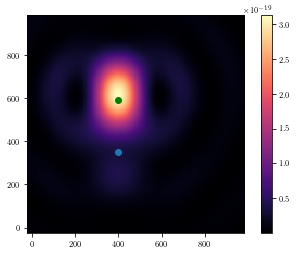

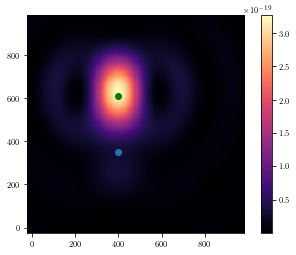

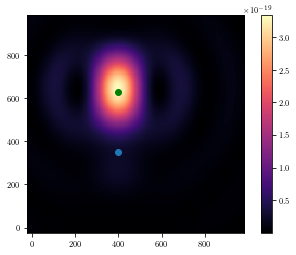

In [717]:
cp_inst=CoupledDipoles(obs_points=hres_obs_pts)

for i in np.arange(20, 300, 20):
    field_output = cp_inst.dipole_fields(
            np.array([[0,i, 0]]), 
            mol_angle=np.pi/2, 
            plas_angle=np.pi/2, 
            plas_centroid=np.array([[500, 500, 0]])
            )
    a_coup_image = cp_inst.image_from_E(field_output[0]+field_output[1])


    
    plt.figure()
    ax=plt.axes()
    
    img = ax.imshow( 
        a_coup_image.reshape(201,201).T, origin='lower',
        extent=[0-48/2, 48*21-48/2, 0-48/2, 48*21-48/2])

#     ## Scatter plasmon
#     ax.scatter(400, 350)
#     ## Scatter mol
#     ax.scatter(0+400, i+350, c='green')
    
    plt.colorbar(img)
    plt.show()
    

## PLot lome simulated molecules

In [ ]:
# # Model fit
# # Gaussian guess, checked

# test_BEM_fit_instance_few_mol_h_100 = fit.FitModelToData(
#     simTestInst_few_mol_h_100.BEM_images, 
# #     ini_guess=simTestInst_few_mol.mol_locations,
#     ini_guess='gauss'
#     )
# test_BEM_fit_few_mol_h_100 = test_BEM_fit_instance_few_mol_h_100.fit_model_to_image_data(
#     check_ini=True)

# ## Plot fit results
# test_BEM_fit_instance_few_mol_h_100.plot_fit_results_as_quiver_map(simTestInst_few_mol_h_100)   